In [ ]:
# Version V1.1:
# Separate file for segmentation re-do. Multiple files can be re-segmented at the same time using modelNames. 
# Script loops through all datapaths and modelNames. 

## surface segmentation using ilastik, from h5 files

In [1]:
import ilastik.experimental.api
from ilastik.experimental.api import from_project_file
from xarray import DataArray

#### Load Libraries

In [2]:
# The environment to use here is: celltraj_env
#%%capture
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sys
sys.path.insert(0,'/mnt/c/Users/copperma/OneDrive/Documents/cell/celltraj/celltraj')
import trajectory
import imageprep as imprep
import utilities
import features
import model
import h5py
import pickle
import os
import subprocess
import time
#import bootstrap
import umap
import pyemma.coordinates as coor
import scipy
import csaps
import skimage
from IPython.display import clear_output
import os
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components
np.float=np.dtype(float)
np.int=int
import msmtools
import pandas
import itertools
import ray

Solver suite is petsc


#### Load File Details

In [3]:
#%%capture

# This date is to make folders of analysis based off the date you do the analysis. 
date = '5dec24'
os.system(f'mkdir -p {date}')

# Make sure the model names are correct since these are what the file names have been called. If you want to rename
# the files, use script 'file_rename'
modelNames = [f'20241004_OS17lungInh2_RM'] 

datapaths=['/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM']

#### Loop through the segmented files

In [4]:
#%%capture
import imageprep as imprep
import itertools

modelLists = [None]*len(modelNames)
inds_imagingSet=[]
for idataset in range(len(modelNames)):
    modelLists[idataset]=imprep.list_images(f'{datapaths[idataset]}/{modelNames[idataset]}_xy*_roi*.h5')
    inds_dataset=[idataset]*len(modelLists[idataset])
    inds_imagingSet.append(inds_dataset)

inds_imagingSet=list(itertools.chain(*inds_imagingSet))

for ilist in range(len(modelLists)):
    print(f'movies: {modelLists[ilist]}')

movies: ['/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy10_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy11_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy12_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy13_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy14_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy15_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy16_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_

#### Surface segmentation

In [5]:
def get_surf_fmask_lung_cancer(img_ilastik,ilastik_model,cdict_ilp,cdict_surf,histp=None,sigma=5,thresh=0.2,return_prediction=False):
    image = DataArray(img_ilastik, dims=("y", "x", "c"))
    prediction = ilastik_model.predict(image)
    prediction=prediction.to_numpy()
    for ichannel in range(prediction.shape[2]):
        pred=prediction[...,ichannel]
        if sigma is not None:
            pred=scipy.ndimage.gaussian_filter(pred,sigma=sigma)
        if histp is not None:
            plow, phigh = np.percentile(pred, (histp[0], histp[1]))
            pred=(pred-plow)/(phigh-plow)
        prediction[...,ichannel]=pred
    max_pred=np.argmax(prediction,axis=2)
    fmasks=np.zeros((img_ilastik.shape[0],img_ilastik.shape[1],2)).astype(bool)
    fmasks[...,0]=(prediction[...,cdict_ilp['lung']]-prediction[...,cdict_ilp['airway']]>thresh)
    fmasks[...,1]=(prediction[...,cdict_ilp['live-cancer']]+prediction[...,cdict_ilp['dead-cancer']]-prediction[...,cdict_ilp['lung']]-prediction[...,cdict_ilp['airway']]>thresh)
    if return_prediction:
        return prediction,fmasks
    else:
        return fmasks
    return fmasks

In [20]:
def show_3dseg_proj(fig,im3d,labels,surfaces=None,surf_cmaps=None,labels2=None,fmsk=None,zscale=None,label_color='black',label2_color='red',img_cmap=plt.cm.gray_r):
    if zscale is not None:
        im3d=skimage.transform.rescale(im3d,(zscale,1,1),anti_aliasing=False)
        labels=skimage.transform.rescale(labels,(zscale,1,1),order=0)
        for isurf in range(len(surfaces)):
            surfaces[isurf]=skimage.transform.rescale(surfaces[isurf],(zscale,1,1),order=0)
        if labels2 is not None:
            labels2=skimage.transform.rescale(labels2,(zscale,1,1),order=0)
    if surf_cmaps is None and surfaces is not None:
        print(len(surfaces))
        surf_cmaps=[plt.cm.Blues,plt.cm.Greens,plt.cm.Reds,plt.cm.Purples,plt.cm.Oranges,plt.cm.Blues,plt.cm.Greens]
    if label_color is None:
        label_color='black'
    if label2_color is None:
        label2_color='red'
    if img_cmap is None:
        img_cmap=plt.cm.gray_r
    zproj=np.sum(im3d,axis=0)
    xproj=np.sum(im3d,axis=1)
    yproj=np.sum(im3d,axis=2)
    labels_zproj=np.max(labels,axis=0)
    labels_xproj=np.max(labels,axis=1)
    labels_yproj=np.max(labels,axis=2)
    plt.subplot(1,3,1)
    plt.imshow(zproj,cmap=img_cmap)
    plt.contour(labels_zproj,levels=np.arange(np.max(labels_zproj)),colors=label_color,linewidths=1)
    if surfaces is not None:
        for isurf in range(len(surfaces)):
            surf_viz=np.sum(surfaces[isurf],axis=0)
            plt.imshow(np.ma.masked_where(np.logical_not(surf_viz>0),surf_viz),alpha=.3,cmap=surf_cmaps[isurf])#,clim=(0,1))
    if labels2 is not None:
        labels2_zproj=np.max(labels2,axis=0)
        plt.contour(labels2_zproj,levels=np.arange(np.max(labels2_zproj)),colors=label2_color,linewidths=1)  
    plt.axis('equal');plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(xproj,cmap=img_cmap)
    plt.contour(labels_xproj,levels=np.arange(np.max(labels_xproj)),colors=label_color,linewidths=1)
    if surfaces is not None:
        for isurf in range(len(surfaces)):
            surf_viz=np.sum(surfaces[isurf],axis=1)
            plt.imshow(np.ma.masked_where(np.logical_not(surf_viz>0),surf_viz),alpha=.3,cmap=surf_cmaps[isurf])#,clim=(0,1))
    if labels2 is not None:
        labels2_xproj=np.max(labels2,axis=1)
        plt.contour(labels2_xproj,levels=np.arange(np.max(labels2_xproj)),colors=label2_color,linewidths=1)
    plt.axis('equal');plt.axis('off')
    plt.subplot(1,3,3)
    plt.imshow(yproj,cmap=img_cmap)
    plt.contour(labels_yproj,levels=np.arange(np.max(labels_yproj)),colors=label_color,linewidths=1)
    if labels2 is not None:
        labels2_yproj=np.max(labels2,axis=2)
        plt.contour(labels2_yproj,levels=np.arange(np.max(labels2_yproj)),colors=label2_color,linewidths=1)
    if surfaces is not None:
        for isurf in range(len(surfaces)):
            surf_viz=np.sum(surfaces[isurf],axis=2)
            plt.imshow(np.ma.masked_where(np.logical_not(surf_viz>0),surf_viz),alpha=.3,cmap=surf_cmaps[isurf])#,clim=(0,1)) 
    plt.axis('equal');plt.axis('off')

In [7]:
cdict_ilp={'dead-cancer':0,'live-cancer':1,'lung':2,'airway':3}
cdict_surf={'cancer':0,'lung':1,'airway':2,'dead':3}
fmask_channels=['foreground','nuc','lung','cancer']

n_fmasks=2
ndimage=scipy.ndimage
nucl=25                                 #typical nucleus linear diameter pixels
micron_per_pixel=.33                    #lateral resolution (image pixel size)
micron_per_z=3.0                        #axial resolution between z-slices
nucl=25
rsmooth=nucl/4
thresh=0.2
zscale=micron_per_z/micron_per_pixel

ilastik_modelpath='/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/Death2/20241023_death_identification_RM_16nov24.ilp'
ilastik_model = from_project_file(ilastik_modelpath)

vizpath='/home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241208_surfseg'
pathexists = os.path.isdir(vizpath)     #create image folder if it doesn't exist already
if not pathexists:
    os.mkdir(vizpath)
    
visual=True
modelList_flat=list(itertools.chain(*modelLists))

In [24]:
# Actual surface segmentation
modelList_flat=list(itertools.chain(*modelLists))
modelSet=[None]*len(modelList_flat)
for i in [15,26,27,32]: #range(len(modelList_flat)): 
    try:
        h5filename=modelList_flat[i]
        modelSet[i]=trajectory.Trajectory(h5filename=h5filename)
        sctm=modelSet[i]
        moviename=sctm.figid.decode() #unique for each h5 file
        #status=modelSet[i].load_from_h5('/cell_data_m0/')
        modelSet[i].get_image_shape()                             #some missing info, add in to metadata in future
        fore_fmsk_channel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        try:
            nuc_fmsk_channel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
            nuc_fmsk_channel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
            nuc_msk_channel=None
            fore_msk_channel=None
        except Exception as e:
            print(e)
            nuc_msk_channel=np.where(sctm.mask_channels==np.array(['nuc']).astype('S32'))[0][0]
            fore_msk_channel=np.where(sctm.mask_channels==np.array(['nuc']).astype('S32'))[0][0]
            nuc_fmsk_channel=None
            fore_fmsk_channel=None
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel
        sctm.mskchannel=0
        nt_roi=sctm.nt;nx_roi=sctm.nx;ny_roi=sctm.ny;nz_roi=sctm.nz
        sctm.ilastik_modelpath=ilastik_modelpath
        sctm.fmask_channels=fmask_channels
        sctm.save_to_h5('/metadata/',['ilastik_modelpath','fmask_channels'],overwrite=True)
        print(f'loaded {sctm.h5filename} with {sctm.mask_channels} mask channels, {sctm.channels} image channels, cell index on {mskchannel}') 
        nuc_channel=nuc_img_channel
        rep_channel=erk_img_channel
        bf_channel=bf_img_channel
        for iS in range(nt_roi):
            fstr=f'/images/img_{iS}/fmsk'
            with h5py.File(h5filename,'r') as h:
                try:
                    fmsk_df=h[fstr]
                    print(f'{fstr} shape {fmsk_df[...].shape}')
                    fmsk_dim=fmsk_df[...].shape[3]
                except Exception as e:
                    print(e)
                    fmsk_dim=0
            if fmsk_dim!=4:
                img=sctm.get_image_data(iS)
                msk=sctm.get_mask_data(iS)
                if nuc_fmsk_channel is not None:
                    fmsk_fore=sctm.get_fmask_data(iS,channel=fore_fmsk_channel)
                    fmsk_nuc=sctm.get_fmask_data(iS,channel=nuc_fmsk_channel)
                else:
                    fmsk_fore=msk[...,fore_msk_channel]>0
                    fmsk_nuc=msk[...,nuc_msk_channel]>0
                im3d_nuc=utilities.rescale_to_int(imprep.znorm(img[...,nuc_channel]))
                im3d_rep=utilities.rescale_to_int(imprep.znorm(img[...,rep_channel]))
                im3d_bf=imprep.znorm(img[...,bf_channel])
                im3d_bf=skimage.filters.difference_of_gaussians(im3d_bf,.5,1.5)
                im3d_bf=utilities.rescale_to_int(im3d_bf)
                cellpose_img=np.zeros((nz_roi,3,nx_roi,ny_roi)).astype(np.uint16)
                cellpose_img[:,0,:,:]=im3d_bf #add in nuc so not hollow
                cellpose_img[:,1,:,:]=im3d_rep
                cellpose_img[:,2,:,:]=im3d_nuc
                fmasks=np.zeros((nz_roi,nx_roi,ny_roi,n_fmasks)).astype(bool)
                predictions=np.zeros((nz_roi,nx_roi,ny_roi,len(cdict_ilp)))
                for iz in range(nz_roi):
                    print(f'getting ilastik prediction frame {iS} slice {iz} of {nz_roi}')
                    img_ilastik=cellpose_img[iz,...]
                    img_ilastik=np.swapaxes(img_ilastik,0,2);img_ilastik=np.swapaxes(img_ilastik,0,1)
                    predictions[iz,...],fmasks[iz,...]=get_surf_fmask_lung_cancer(img_ilastik,ilastik_model,cdict_ilp,cdict_surf,sigma=rsmooth,thresh=thresh,return_prediction=True)
                #predictions=(predictions*(2**16-1)).astype(int)
                #img=np.concatenate((img,predictions),axis=3)
                #img=np.concatenate((img[...,0:len(sctm.channels)],predictions[...,0][...,np.newaxis]),axis=3)
                fmsks=np.concatenate((fmsk_fore[...,np.newaxis],fmsk_nuc[...,np.newaxis],fmasks),axis=3)
                imprep.save_frame_h5(sctm.h5filename,iS,img=img,msks=msk,fmsk=fmsks,overwrite=True,timestamp=None)
                if visual:
                    clear_output(wait=True)
                    show_3dseg_proj(plt.figure(figsize=(12,5)),img[...,erk_img_channel],msk[...,0],surfaces=[fmsks[...,2],fmsks[...,3]],zscale=sctm.zscale,label_color='green')
                    plt.title(f'{moviename} frame {iS}')
                    plt.savefig(f'{vizpath}/surf_proj_{moviename}_f{iS}.png')
                    plt.show()
    except Exception as e:
        print(e)
        pass

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
saving attributes ['ilastik_modelpath', 'fmask_channels'] to /metadata/ in /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5
overwrote existing and saved ilastik_modelpath to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5//metadata/
overwrote existing and saved fmask_channels to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5//metadata/
loaded /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5 with [b'cyto'] mask channels, [b'CFP' b'Cy5' b'TRITC' b'YFP' b'DAPI' b'BF'] image channels, cell index on 0
/images/img_0/fms

In [ ]:
#inds_missing=[]
#inds_finished=[]
inds_nosurf=[]
for i in range(len(modelList_flat)): 
    h5filename=modelList_flat[i]
    try:
        with h5py.File(h5filename,'r+') as f:
            #del f['/image/fmskchannel']
            fmsk=f['/images/img_96/fmsk']
            print(fmsk[...].shape)
            cpath=f['/metadata/cellpose_modelpath'][...]
            print(cpath)
            ipath=f['/metadata/ilastik_modelpath'][...]
            print(ipath)
            if fmsk.shape[3]!=4:
                #inds_finished.append(i)  
                inds_nosurf.append(i)
    except:
            print(f'problem on {h5filename}')
            #inds_missing.append(i)

print(np.array(modelList_flat)[inds_nosurf])

### featurize and track, including MVE boundary features

In [36]:
#@ray.remote(num_cpus=4)
def get_cellfeatures_distributed(h5filename):
    output_message=f'featurizing {h5filename}...'
    try:
        sctm=trajectory.Trajectory(h5filename=h5filename)
        sctm.get_image_shape()
        print(f'{sctm.nmaskchannels}')
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
        #sctm.load_from_h5(f'/cell_data_m{sctm.mskchannel}/')
        #output_message=f'{output_message} loaded cell data...'
        sctm.get_frames()
        sctm.get_cell_index(verbose=True,save_h5=True,overwrite=True)
        ntrans=[1,1,1]
        maxt=[0.,0.,0.]
        tf_matrix_set=sctm.get_stack_trans(mskchannel=sctm.mskchannel,ntrans=ntrans,maxt=maxt,dist_function=utilities.get_pairwise_distance_sum,save_h5=True,overwrite=True,do_global=False) #,contact_transform=True,r0=100.,d0=100.,n=6,m=12)
        clear_output(wait=True)
        x=sctm.get_cell_positions(mskchannel=sctm.mskchannel,save_h5=True,overwrite=True)
        clear_output(wait=True)
        tf_matrix_set_pad,pad_dims=imprep.get_registration_expansions(sctm.tf_matrix_set,sctm.nz,sctm.nx,sctm.ny)
        sctm.pad_dims=np.array(pad_dims)
        sctm.save_to_h5(f'/cell_data_m{mskchannel}/',['pad_dims'])
        clear_output(wait=True)
        ot_costs,linSet=sctm.get_lineage_min_otcost(distcut=0.5*sctm.cellpose_diam,return_cost=True,ot_cost_cut=np.inf,border_resolution=1.33,visual=False,save_h5=True,overwrite=True)
        output_message=f'{output_message} tracked...'
        clear_output(wait=True)
        #Bright field features with cyto masks
        Xf,feature_list=sctm.get_cell_features((features.featZernike,features.featHaralick,features.featBoundary),indcells=None,imgchannel=bf_img_channel,mskchannel=cyto_msk_channel,return_feature_list=True,save_h5=True,overwrite=True)
        #foreground mask boundary features
        clear_output(wait=True)
        bordersize=int(sctm.cellpose_diam/5.)
        Xf,feature_list=sctm.get_cell_features((features.featBoundaryCB),indcells=None,imgchannel=0,mskchannel=cyto_msk_channel,use_fmask_for_intensity_image=True,fmskchannel=foreground_fmskchannel,bordersize=bordersize,return_feature_list=True,save_h5=True,overwrite=True,concatenate_features=True)
        clear_output(wait=True)
        #boundary features to monitor cancer cell neighbors
        Xf,feature_list=sctm.get_cell_features((features.featBoundaryCB),indcells=None,use_mask_for_intensity_image=True,apply_contact_transform=True,bordersize=int(bordersize/2),imgchannel=cyto_msk_channel,mskchannel=cyto_msk_channel,return_feature_list=True,save_h5=True,overwrite=True,concatenate_features=True)
        output_message=f'{output_message} bf features...'
        clear_output(wait=True)
        #motility features
        #Xf_com=sctm.get_motility_features(mskchannel=cyto_msk_channel,save_h5=True,overwrite=True)
        #output_message=f'{output_message} motility features...'
        clear_output(wait=True)
        #signaling features
        corrc_erk=sctm.get_cell_channel_crosscorr(mskchannel=cyto_msk_channel,imgchannel1=nuc_img_channel,imgchannel2=erk_img_channel,save_h5=True,overwrite=True)
        corrc_erk=1.-corrc_erk
        clear_output(wait=True)
        cratio_erk=sctm.get_cell_compartment_ratio(imgchannel=erk_img_channel,mskchannel1=cyto_msk_channel,mskchannel2=None,fmask_channel=nuc_fmskchannel,make_disjoint=True,remove_background_perframe=True,inverse_ratio=False,save_h5=True,overwrite=True)
        clear_output(wait=True)
        corrc_akt=sctm.get_cell_channel_crosscorr(mskchannel=cyto_msk_channel,imgchannel1=nuc_img_channel,imgchannel2=akt_img_channel,save_h5=True,overwrite=True)
        corrc_akt=1.-corrc_akt
        clear_output(wait=True)
        cratio_akt=sctm.get_cell_compartment_ratio(imgchannel=akt_img_channel,mskchannel1=cyto_msk_channel,mskchannel2=None,fmask_channel=nuc_fmskchannel,remove_background_perframe=True,make_disjoint=True,inverse_ratio=False,save_h5=True,overwrite=True)
        clear_output(wait=True)
        output_message=f'{output_message} signaling features...'
        #nuclear features with cyto masks
        Xf1,feature_list1=sctm.get_cell_features((features.featZernike,features.featHaralick),indcells=None,imgchannel=nuc_img_channel,mskchannel=cyto_msk_channel,return_feature_list=True)
        #nuclear shape features with cyto masks, nuc masks as intensity image
        Xf2,feature_list2=sctm.get_cell_features((features.featNucBoundary),mskchannel=cyto_msk_channel,indcells=None,use_fmask_for_intensity_image=True,fmskchannel=nuc_fmskchannel,return_feature_list=True)
        nucintensity_DAPI=sctm.get_cell_compartment_ratio(imgchannel=nuc_img_channel,mskchannel1=cyto_msk_channel,mskchannel2=None,fmask_channel=nuc_fmskchannel,make_disjoint=True,remove_background_perframe=True,inverse_ratio=True,noratio=True)
        #cyto mask with reporter channel features
        Xf3,feature_list3=sctm.get_cell_features((features.featSize,features.meanIntensity,features.totalIntensity),indcells=None,imgchannel=erk_img_channel,mskchannel=cyto_msk_channel,return_feature_list=True)
        #nuclear shape features with cyto masks, nuc masks as intensity image
        Xf_death=np.concatenate((Xf1,Xf2,nucintensity_DAPI[:,np.newaxis],Xf3),axis=1)
        feature_list_death=feature_list1+feature_list2+['nucintensity_DAPI']+feature_list3
        sctm.Xf_death=Xf_death
        sctm.feature_list_death=feature_list_death
        sctm.save_to_h5(f'/cell_data_m{mskchannel}/',['Xf_death','feature_list_death'])
        nucintensity_fra1=sctm.get_cell_compartment_ratio(imgchannel=fra1_img_channel,mskchannel1=cyto_msk_channel,mskchannel2=None,fmask_channel=nuc_fmskchannel,make_disjoint=True,remove_background_perframe=True,inverse_ratio=True,noratio=True)
        sctm.nucintensity_fra1=nucintensity_fra1
        sctm.save_to_h5(f'/cell_data_m{mskchannel}/',['nucintensity_fra1'])
        output_message=f'{output_message} added fra1 nuc intensity...'
        sctm.get_cellboundary_library(surface_fmask_channels=[2,3],border_resolution=1.33,visual=False,save_h5=True,overwrite=True)
        output_message=f'{output_message} added MVE boundary features...'
    except Exception as e:
        output_message=f'{output_message} {e}'
    return output_message

In [ ]:
results = [get_cellfeatures_distributed(h5filename) for h5filename in np.array(modelList_flat)]

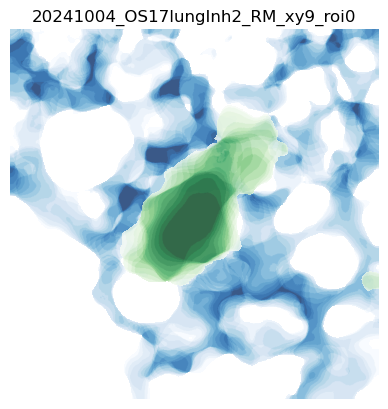

In [105]:
#create consensus surface masks and save to h5
for i in range(len(modelList_flat)): 
    h5filename=modelList_flat[i]
    sctm=trajectory.Trajectory(h5filename=h5filename)
    sctm.get_image_shape()
    print(f'{sctm.nmaskchannels}')
    cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
    nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
    foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
    nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
    mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
    sctm.load_from_h5(f'/cell_data_m{sctm.mskchannel}/')
    fmsks=np.zeros((sctm.nz,sctm.nx,sctm.ny,sctm.nt)).astype(bool)
    for iS in range(sctm.nt):
        fmsks[...,iS]=sctm.get_fmask_data(iS,channel=3)    
    fmsk_cancer=np.median(fmsks,axis=3).astype(bool)
    fmsks=np.zeros((sctm.nz,sctm.nx,sctm.ny,sctm.nt)).astype(bool)
    for iS in range(sctm.nt):
        fmsks[...,iS]=sctm.get_fmask_data(iS,channel=2)    
    fmsk_lung=np.median(fmsks,axis=3).astype(bool)    
    sctm.fmsk_cancer=fmsk_cancer
    sctm.fmsk_lung=fmsk_lung
    sctm.save_to_h5(f'/cell_data_m{sctm.mskchannel}/',['fmsk_cancer','fmsk_lung'])
    clear_output(wait=True)
    plt.imshow(np.ma.masked_where(np.logical_not(np.max(fmsk_lung,axis=0)),np.sum(fmsk_lung,axis=0)),cmap=plt.cm.Blues,alpha=.8)
    plt.imshow(np.ma.masked_where(np.logical_not(np.max(fmsk_cancer,axis=0)),np.sum(fmsk_cancer,axis=0)),cmap=plt.cm.Greens,alpha=.8)
    plt.axis('off')
    plt.title(f'{sctm.figid.decode()}')
    plt.savefig(f'{date}/{sctm.figid.decode()}_consensus_surf.png')
    plt.show()

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5:/cell_data_m0/


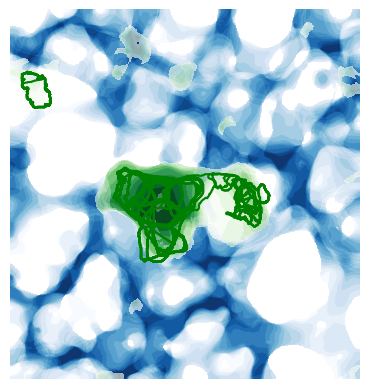

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy10_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy10_roi0.h5:/cell_data_m0/


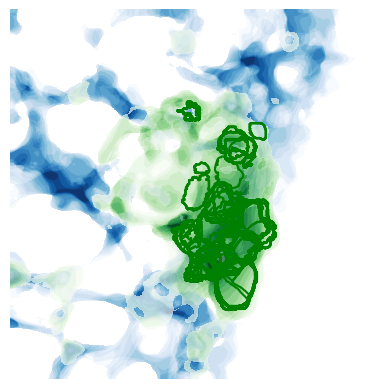

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy11_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy11_roi0.h5:/cell_data_m0/


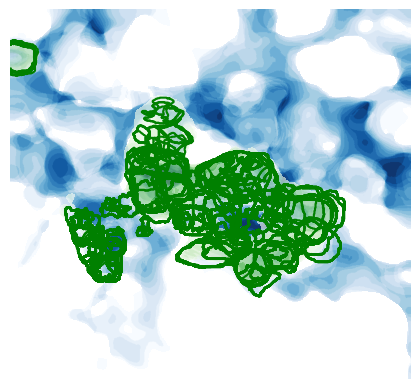

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy12_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy12_roi0.h5:/cell_data_m0/


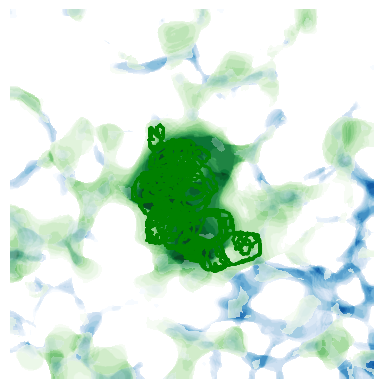

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy13_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy13_roi0.h5:/cell_data_m0/


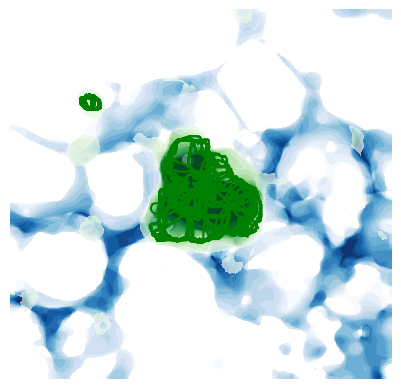

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy14_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy14_roi0.h5:/cell_data_m0/


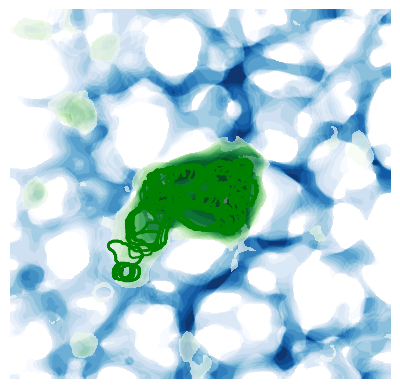

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy15_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy15_roi0.h5:/cell_data_m0/


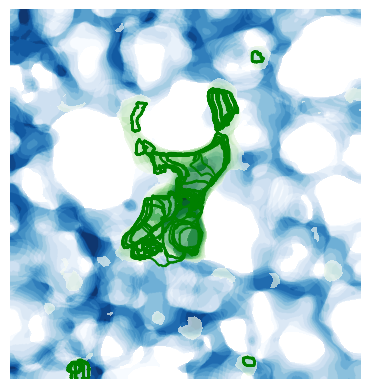

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy16_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy16_roi0.h5:/cell_data_m0/


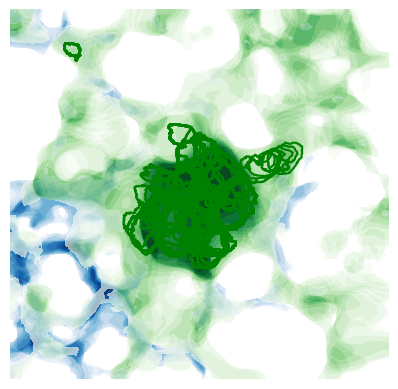

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy17_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy17_roi0.h5:/cell_data_m0/


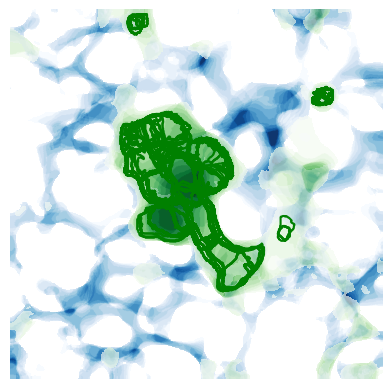

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy18_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy18_roi0.h5:/cell_data_m0/


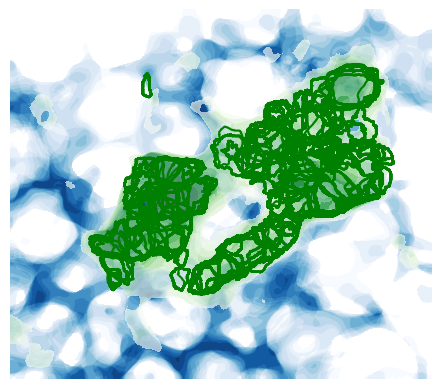

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy19_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy19_roi0.h5:/cell_data_m0/


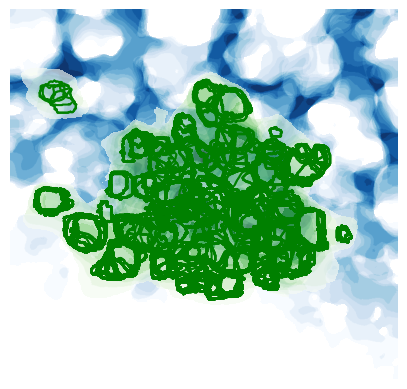

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy1_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy1_roi0.h5:/cell_data_m0/


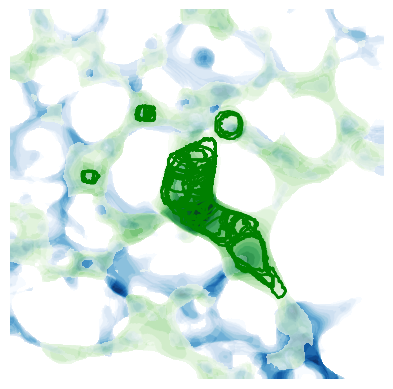

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy20_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy20_roi0.h5:/cell_data_m0/


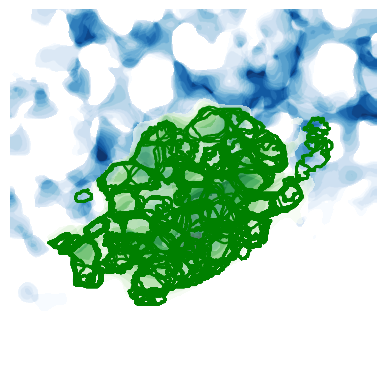

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy21_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy21_roi0.h5:/cell_data_m0/


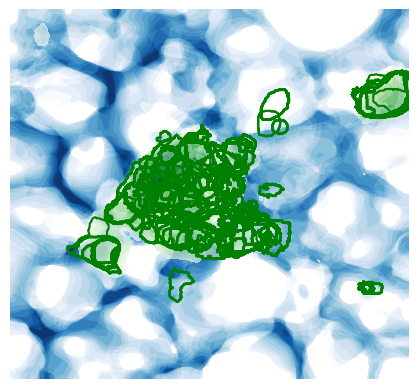

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy22_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy22_roi0.h5:/cell_data_m0/


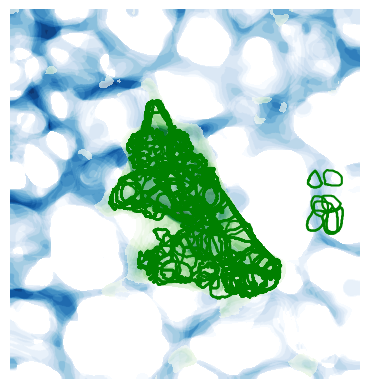

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5:/cell_data_m0/


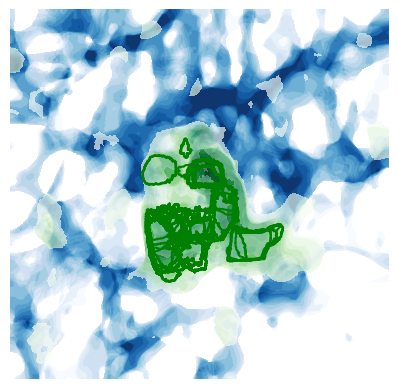

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy24_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy24_roi0.h5:/cell_data_m0/


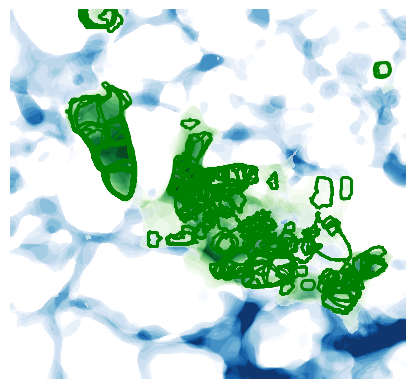

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy25_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy25_roi0.h5:/cell_data_m0/


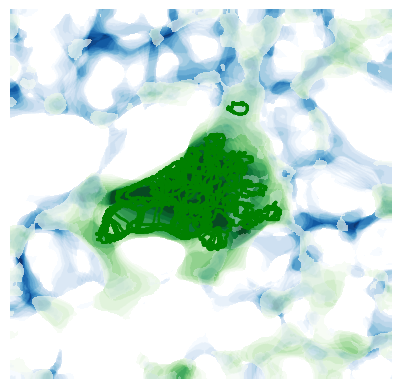

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy26_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy26_roi0.h5:/cell_data_m0/


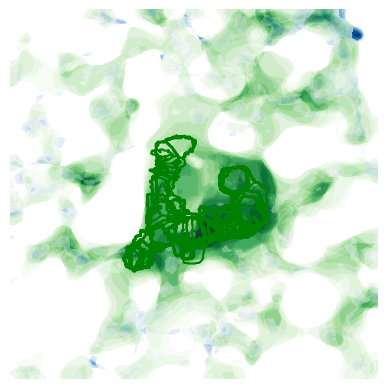

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy27_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy27_roi0.h5:/cell_data_m0/


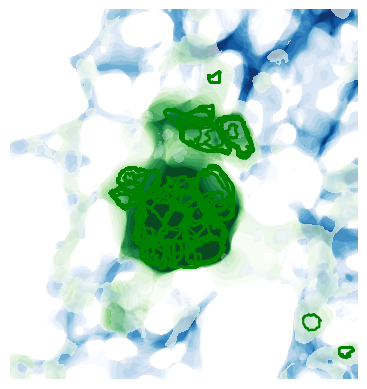

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy28_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy28_roi0.h5:/cell_data_m0/


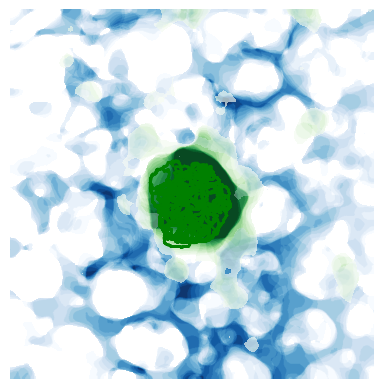

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy29_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy29_roi0.h5:/cell_data_m0/


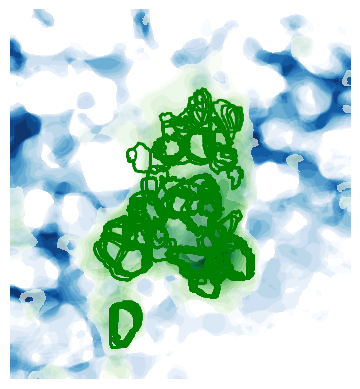

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy2_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy2_roi0.h5:/cell_data_m0/


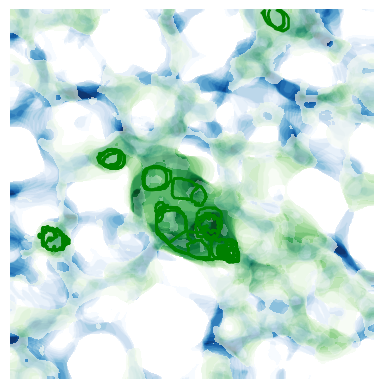

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy30_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy30_roi0.h5:/cell_data_m0/


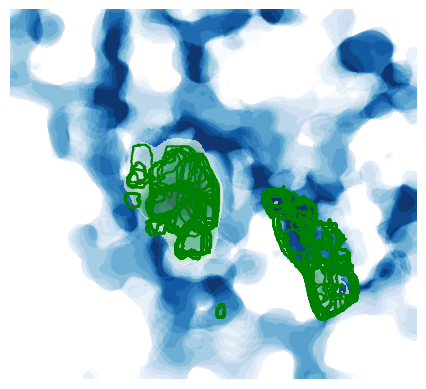

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy31_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy31_roi0.h5:/cell_data_m0/


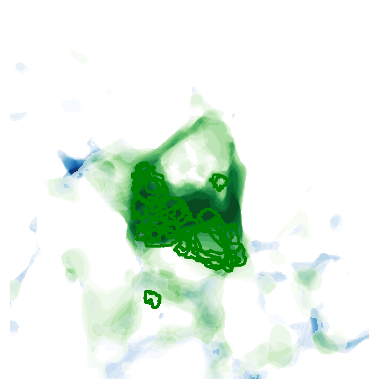

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy32_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy32_roi0.h5:/cell_data_m0/


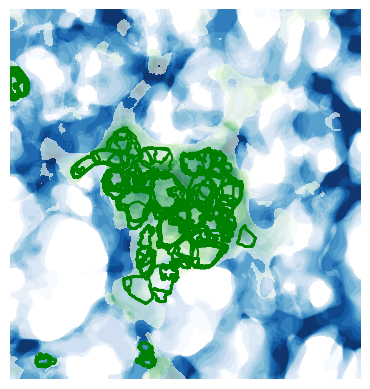

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy33_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy33_roi0.h5:/cell_data_m0/


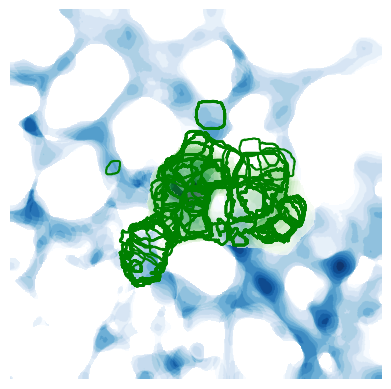

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy34_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy34_roi0.h5:/cell_data_m0/


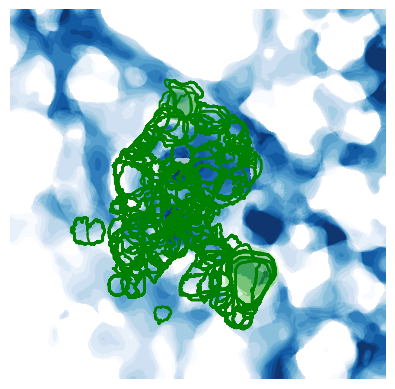

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy35_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy35_roi0.h5:/cell_data_m0/


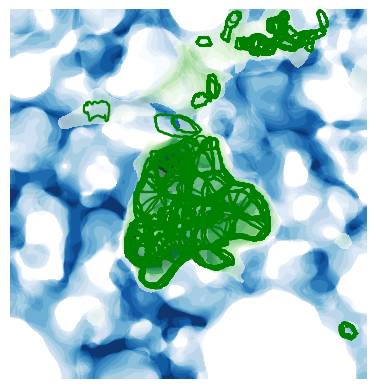

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy36_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy36_roi0.h5:/cell_data_m0/


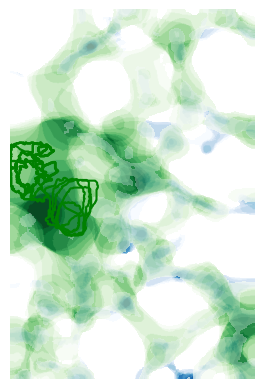

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy36_roi1.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy36_roi1.h5:/cell_data_m0/


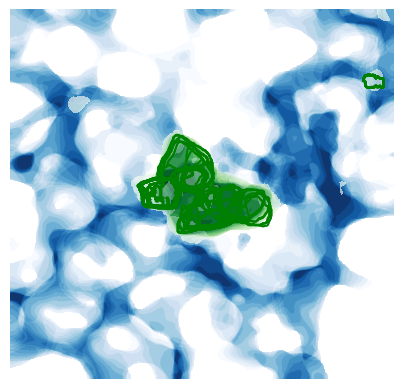

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy37_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy37_roi0.h5:/cell_data_m0/


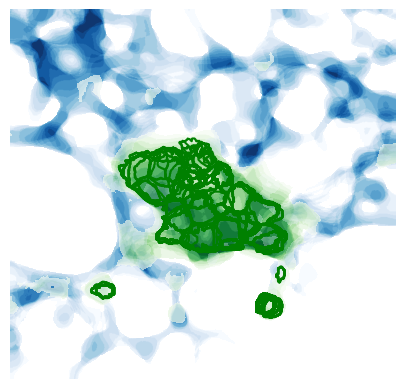

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy38_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy38_roi0.h5:/cell_data_m0/


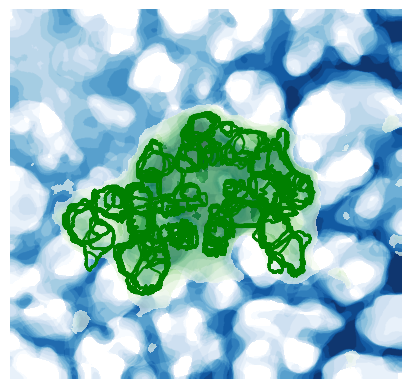

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy3_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy3_roi0.h5:/cell_data_m0/


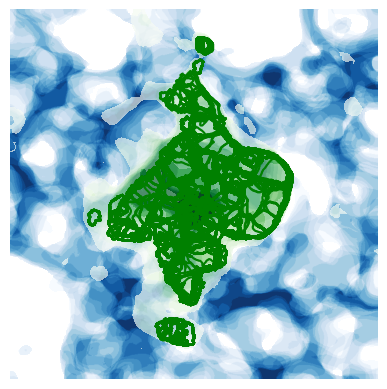

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy4_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy4_roi0.h5:/cell_data_m0/


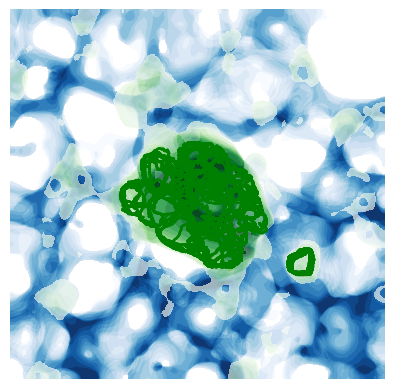

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy5_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy5_roi0.h5:/cell_data_m0/


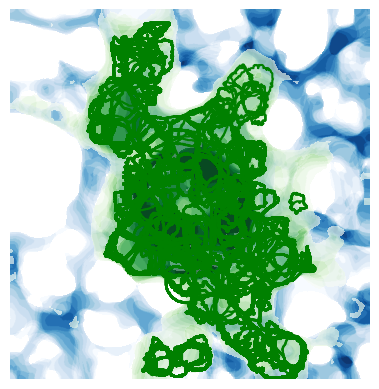

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy6_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy6_roi0.h5:/cell_data_m0/


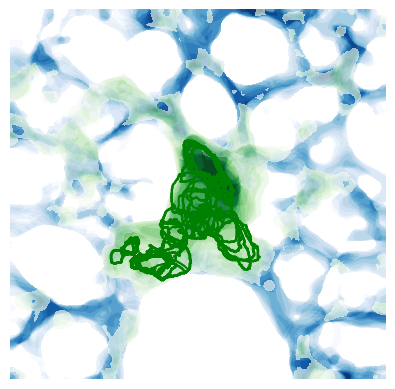

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy7_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy7_roi0.h5:/cell_data_m0/


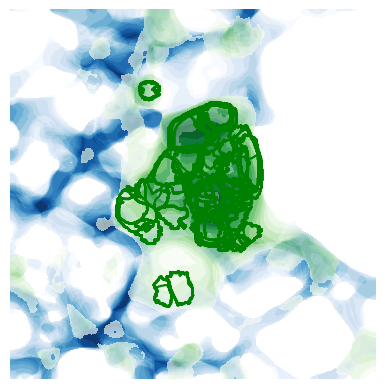

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy7_roi1.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy7_roi1.h5:/cell_data_m0/


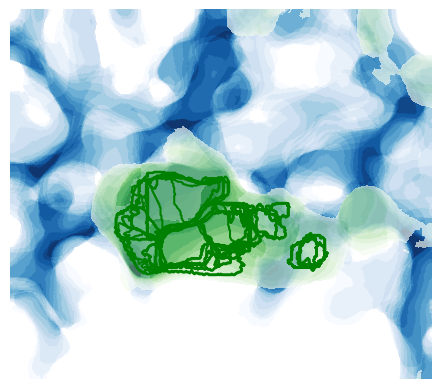

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy8_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy8_roi0.h5:/cell_data_m0/


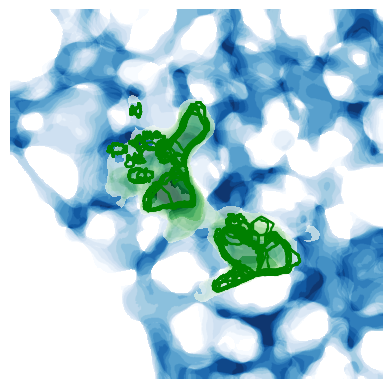

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy9_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy9_roi0.h5:/cell_data_m0/


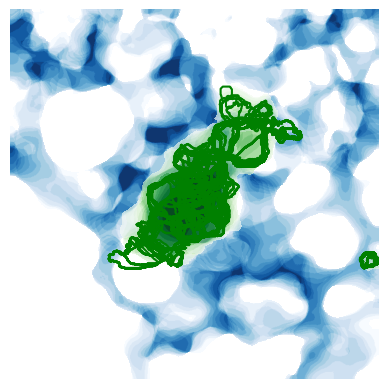

In [131]:
#create consensus surface masks and save to h5
for i in range(len(modelList_flat)): 
    h5filename=modelList_flat[i]
    sctm=trajectory.Trajectory(h5filename=h5filename)
    sctm.get_image_shape()
    print(f'{sctm.nmaskchannels}')
    cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
    nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
    foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
    nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
    mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
    sctm.load_from_h5(f'/cell_data_m{sctm.mskchannel}/')
    plt.figure()
    for iS in range(sctm.nt):
        fstr=f'/images/img_{iS}/fmsk'
        with h5py.File(h5filename,'r+') as h:
            fmsk_df=h[fstr]
            print(f'{fstr} shape {fmsk_df[...].shape}')
            fmsks=fmsk_df[...]  
            fmsks_set=np.concatenate((fmsks,sctm.fmsk_lung[...,np.newaxis],sctm.fmsk_cancer[...,np.newaxis]),axis=3)
            del h[fstr]
            h[fstr]=fmsks_set
        if iS%20==0:
            msk=sctm.get_mask_data(iS)
            #plt.imshow(np.ma.masked_where(np.logical_not(np.max(fmsks[...,2],axis=0)),np.sum(fmsks[...,2],axis=0)),cmap=plt.cm.Purples,alpha=.5)
            plt.imshow(np.ma.masked_where(np.logical_not(np.max(sctm.fmsk_lung,axis=0)),np.sum(sctm.fmsk_lung,axis=0)),cmap=plt.cm.Blues,alpha=.5)
            plt.imshow(np.ma.masked_where(np.logical_not(np.max(sctm.fmsk_cancer,axis=0)),np.sum(sctm.fmsk_cancer,axis=0)),cmap=plt.cm.Greens,alpha=.5)
            #plt.imshow(np.ma.masked_where(np.logical_not(np.max(fmsks[...,3],axis=0)),np.sum(fmsks[...,3],axis=0)),cmap=plt.cm.Wistia,alpha=.5)
            plt.contour(np.max(msk[...,0],axis=0),levels=np.unique(np.max(msk[...,0],axis=0)),colors='green')
            plt.axis('off')
    plt.savefig(f'{date}/{sctm.figid}_cyto_consensus_surf.png')
    plt.show()

In [132]:
indbad_surf=np.array([12,16,1,25,26,27,2,30,31,33,34,36,6,7]).astype(int)
indgood_surf=np.setdiff1d(np.arange(nmodels).astype(int),indbad_surf)

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5:/cell_data_m0/
Extracting boundary library from frame 0
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
ge

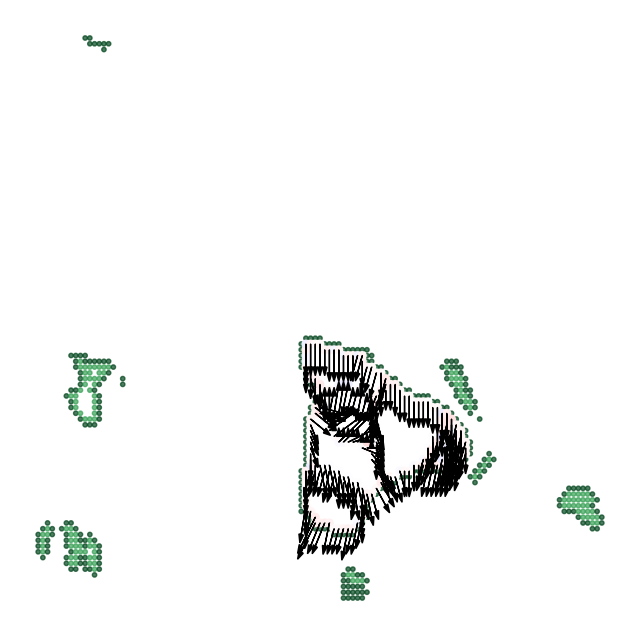

Extracting boundary library from frame 1
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1819
label 2, pixels 156
label 3, pixels 80
adjusted knn: 16 npts: 67
label 4, pixels 188
label 5, pixels 340
label 6, pixels 3173
label 7, pixels 2225
label 8, pixels 1238
label 9, pixels 1034
label 11, pixels 3179
label 12, pixels 883692
cell 1 state 1 conta

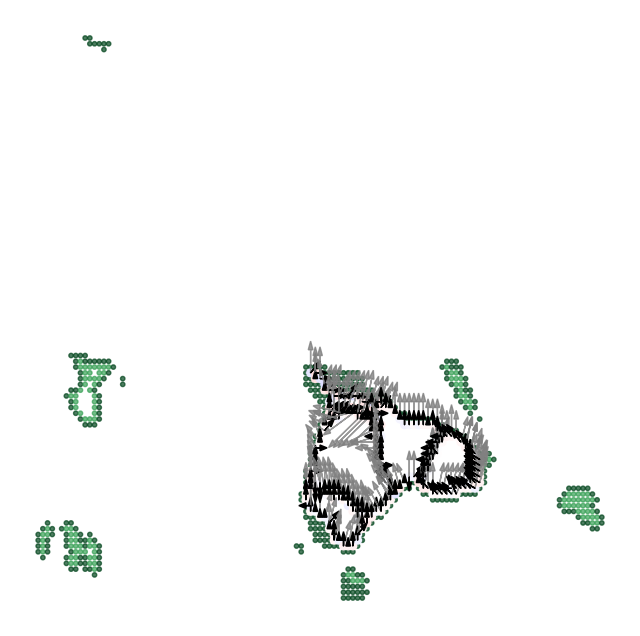

Extracting boundary library from frame 2
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1688
label 2, pixels 214
label 3, pixels 100
label 4, pixels 3310
label 5, pixels 231
label 6, pixels 2234
label 7, pixels 1153
label 8, pixels 1047
label 10, pixels 3178
label 11, pixels 883969
cell 1 state 1 contact fraction 0.13
cell 1 state 2 contact fraction 0.00
cell 1 state 3 conta

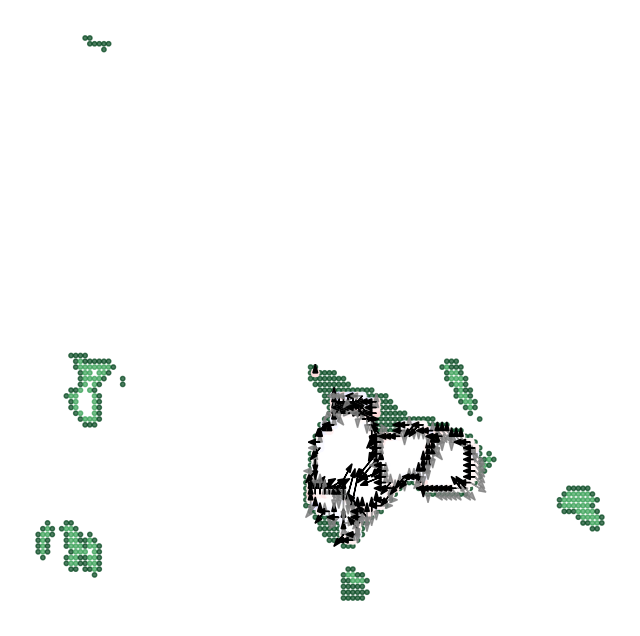

Extracting boundary library from frame 3
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 158
label 2, pixels 1738
label 3, pixels 224
label 4, pixels 292
label 5, pixels 2675
label 6, pixels 2488
label 7, pixels 1273
label 8, pixels 418
label 9, pixels 1013
label 11, pixels 3183
label 12, pixels 883662
cell 1 state 1 contact fraction 0.00
cell 1 s

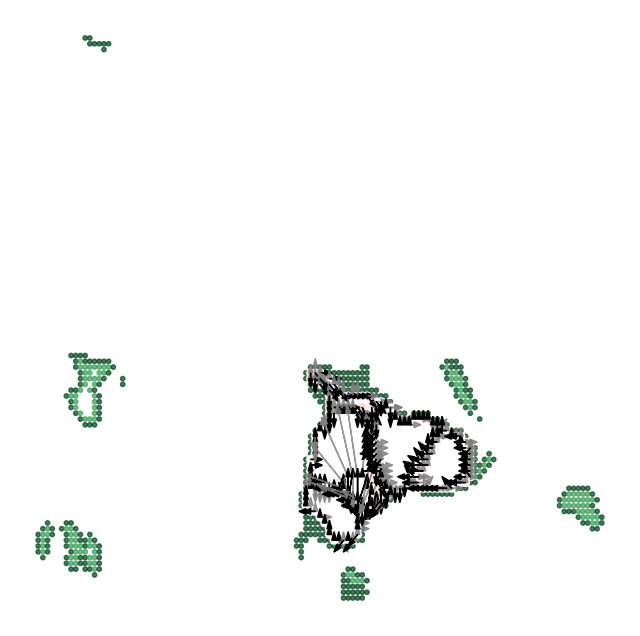

Extracting boundary library from frame 4
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1803
label 2, pixels 150
label 3, pixels 137
label 4, pixels 219
label 5, pixels 277
label 6, pixels 2408
label 7, pixels 2902
label 8, pixels 1228
label 9, pixels 1179
label 11, pixels 3183
label 12, pixels 883638
cell 1 state 1 contact fraction 0.14
cell 1 s

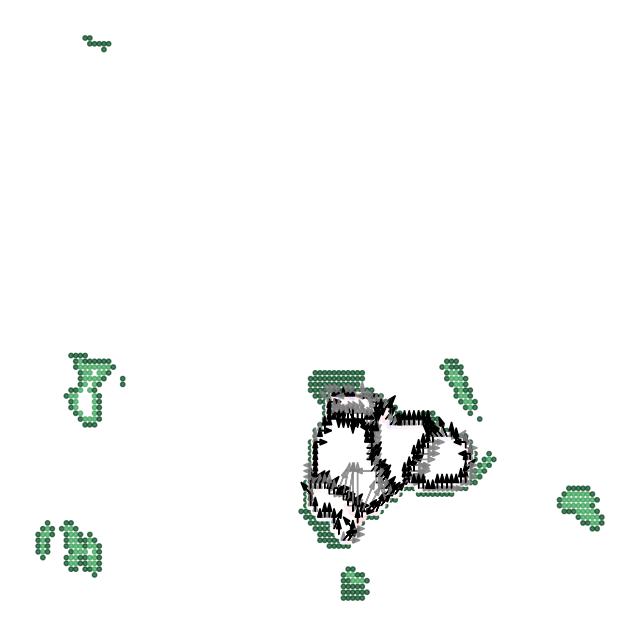

Extracting boundary library from frame 5
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1948
label 2, pixels 287
label 3, pixels 163
label 4, pixels 87
label 5, pixels 215
label 6, pixels 2761
label 7, pixels 2137
label 8, pixels 1211
label 9, pixels 1251
label 11, pixels 3179
label 12, pixels 883885
cell 1 state 1 contact fraction 0.15
cell 1 st

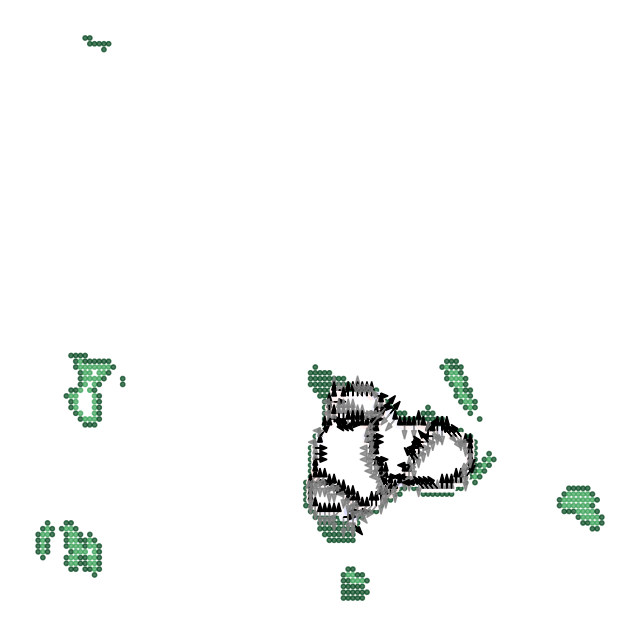

Extracting boundary library from frame 6
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 1109
label 2, pixels 86
label 3, pixels 157
label 4, pixels 128
label 5, pixels 354
label 6, pixels 66
adjusted knn: 14 npts: 58
label 7, pixels 2793
label 8, pixels 919
label 9, pixels 2129
label 10,

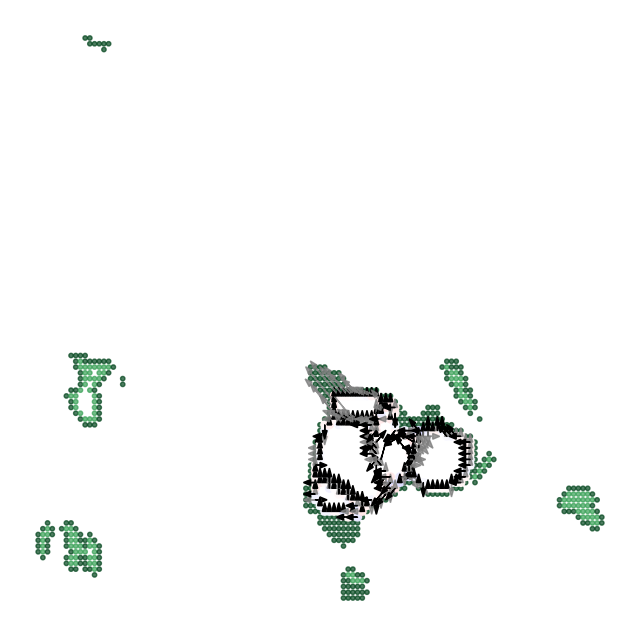

Extracting boundary library from frame 7
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 1024
label 2, pixels 147
label 3, pixels 139
label 4, pixels 522
label 5, pixels 2461
label 6, pixels 1648
label 7, pixels 707
label 8, pixels 72
adjusted knn: 16 npts: 65
label 9, pixels 1209
label 1

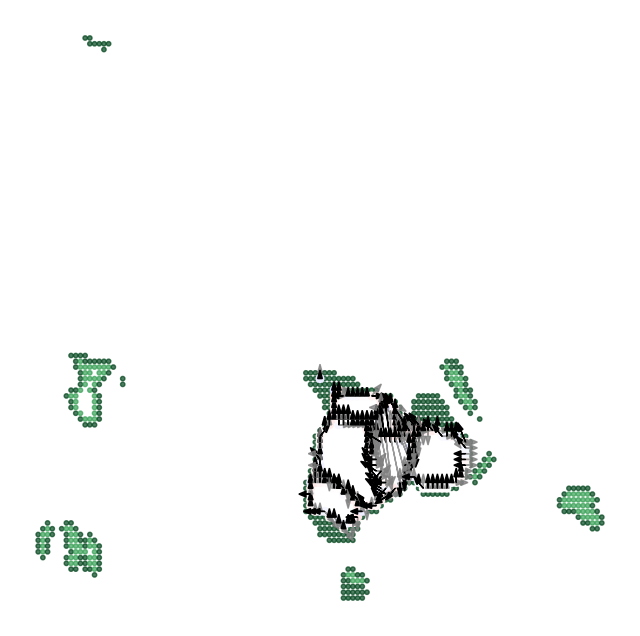

Extracting boundary library from frame 8
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 211
label 2, pixels 1010
label 3, pixels 197
label 4, pixels 339
label 5, pixels 81
adjusted knn: 17 npts: 70
label 6, pixels 962
label 7, pixels 2294
label 8, pixels 2607
label 9, pixels 1214
label 10, pixels 1327
label 12, pixel

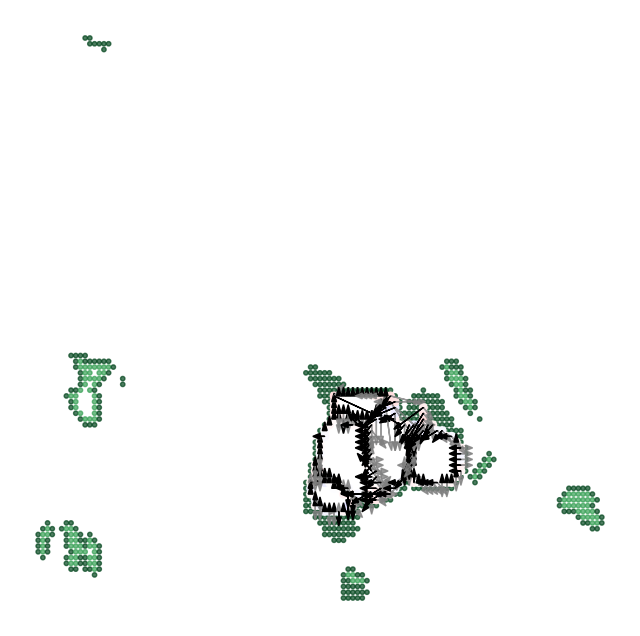

Extracting boundary library from frame 9
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 180
label 2, pixels 1937
label 3, pixels 196
label 4, pixels 311
label 5, pixels 2086
label 6, pixels 2620
label 7, pixels 1270
label 8, pixels 1226
label 9, pixels 302
label 11, pixels 3180
label 12, pixels 883816
cell 1 state 1 contact fraction 0.00
cell 1 s

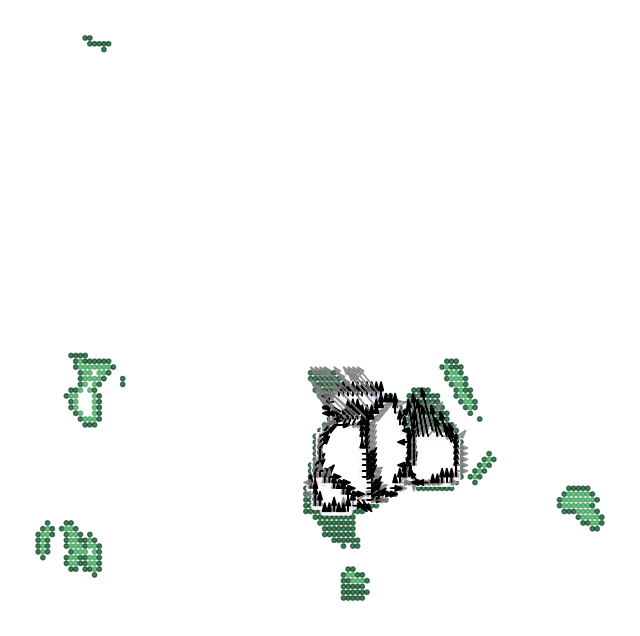

Extracting boundary library from frame 10
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 199
label 2, pixels 89
adjusted knn: 19 npts: 78
label 3, pixels 1871
label 4, pixels 230
label 5, pixels 266
label 6, pixels 2156
label 7, pixels 2502
label 8, pixels 1273
label 9, pixels 1692
label 11, pixels 3177
label 12, pixels 883669
cell 1 state 1 cont

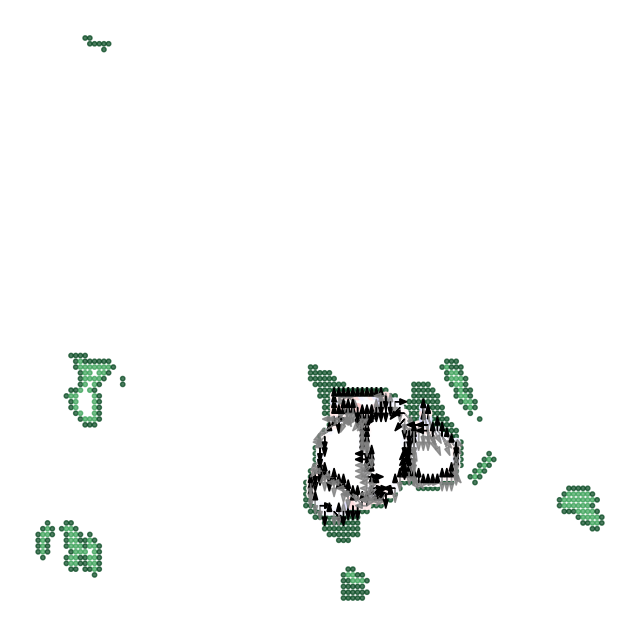

Extracting boundary library from frame 11
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 92
label 2, pixels 241
label 3, pixels 1850
label 4, pixels 341
label 5, pixels 209
label 6, pixels 2223
label 7, pixels 2356
label 8, pixels 1206
label 9, pixels 1760
label 11, pixels 3171
label 12, pixels 883675
cell 1 state 1 contact fraction 0.01
cell 1 s

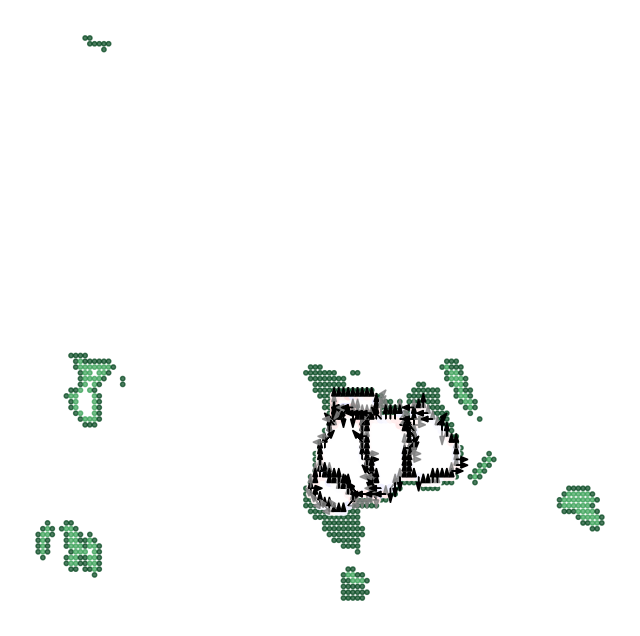

Extracting boundary library from frame 12
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 201
label 2, pixels 1989
label 3, pixels 565
label 4, pixels 114
label 5, pixels 1955
label 6, pixels 2509
label 7, pixels 1752
label 8, pixels 1171
label 10, pixels 3183
label 11, pixels 883685
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 cont

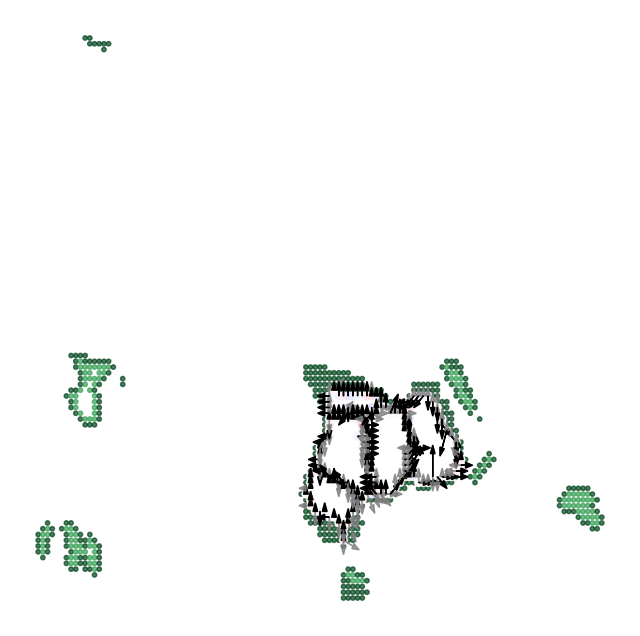

Extracting boundary library from frame 13
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 173
label 2, pixels 2059
label 3, pixels 421
label 4, pixels 165
label 5, pixels 2040
label 6, pixels 2357
label 7, pixels 995
label 8, pixels 817
label 9, pixels 1180
label 11, pixels 3183
label 12, pixels 883734
cell 1 state 1 contact fraction 0.00
cell 1 s

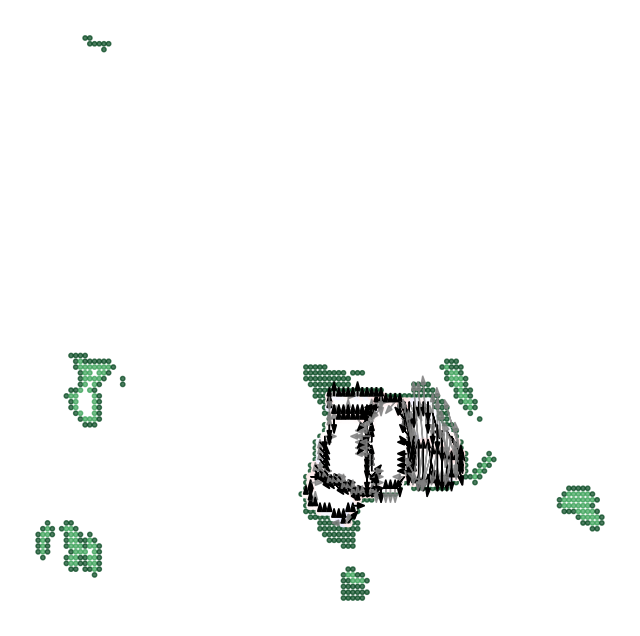

Extracting boundary library from frame 14
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 242
label 2, pixels 2013
label 3, pixels 375
label 4, pixels 232
label 5, pixels 1983
label 6, pixels 2399
label 7, pixels 1947
label 8, pixels 1228
label 10, pixels 3174
label 11, pixels 883531
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 cont

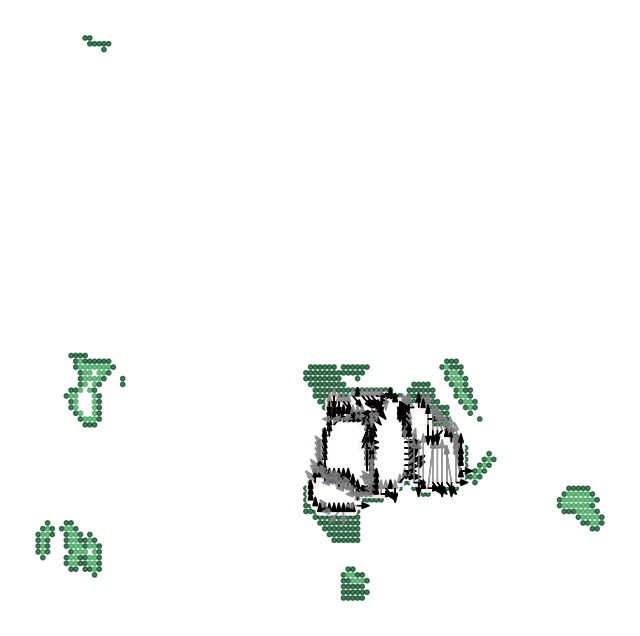

Extracting boundary library from frame 15
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 182
label 2, pixels 88
label 3, pixels 2050
label 4, pixels 297
label 5, pixels 1980
label 6, pixels 238
label 7, pixels 2443
label 8, pixels 62
adjusted knn: 15 npts: 60
label 9, pixels 1347
label 1

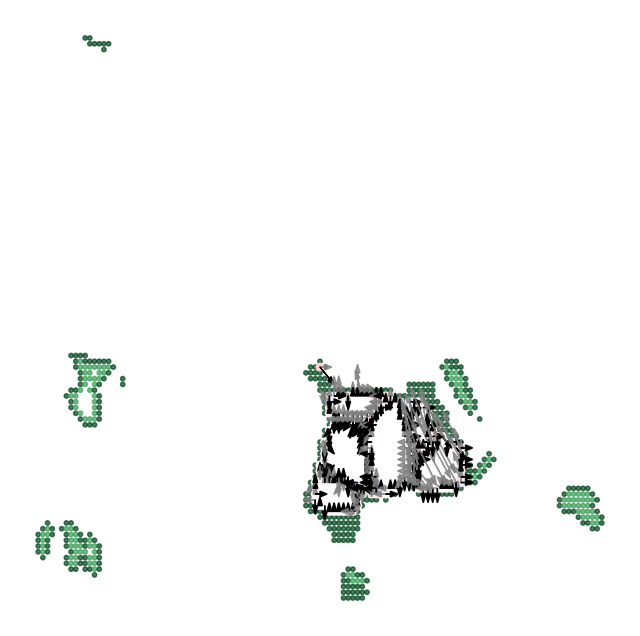

Extracting boundary library from frame 16
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 194
label 2, pixels 90
adjusted knn: 19 npts: 79
label 3, pixels 1089
label 4, pixels 303
label 5, pixels 1462
label 6, pixels 1146
label 7, pixels 332
label 8, pixels 2868
label 9, pixels 1335
label

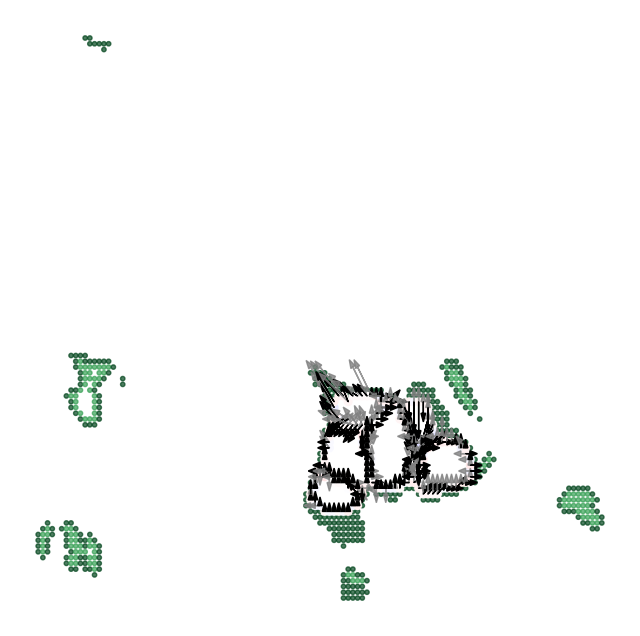

Extracting boundary library from frame 17
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
label 1, pixels 240
label 2, pixels 2335
label 3, pixels 396
label 4, pixels 1285
label 5, pixels 2645
label 6, pixels 73
adjusted knn: 18 npts: 73
label 7, pixels 127
label 8, pixels 8

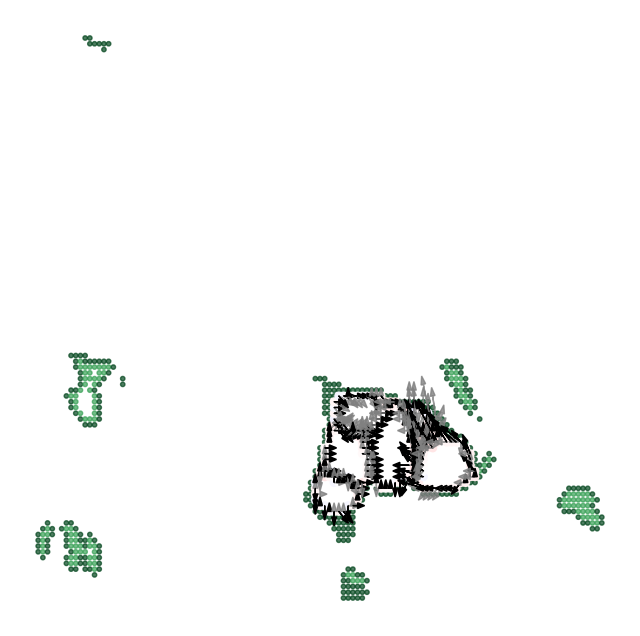

Extracting boundary library from frame 18
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 130
label 2, pixels 98
label 3, pixels 2402
label 4, pixels 194
label 5, pixels 58
adjusted knn: 14 npts: 58
label 6, pixels 1504
label 7, pixels 159
label 8, pixels 2110
label 9, pixels 2162
label 10, pixels 1406
label 12, pixel

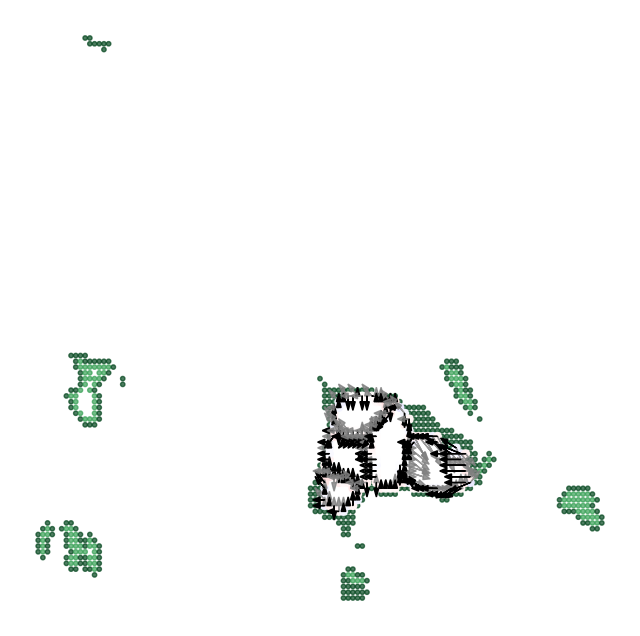

Extracting boundary library from frame 19
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 144
label 2, pixels 110
label 3, pixels 2545
label 4, pixels 207
label 5, pixels 248
label 6, pixels 1064
label 7, pixels 2225
label 8, pixels 1698
label 9, pixels 1354
label 10, pixels 360
label 12, pixels 3166
label 13, pixels 

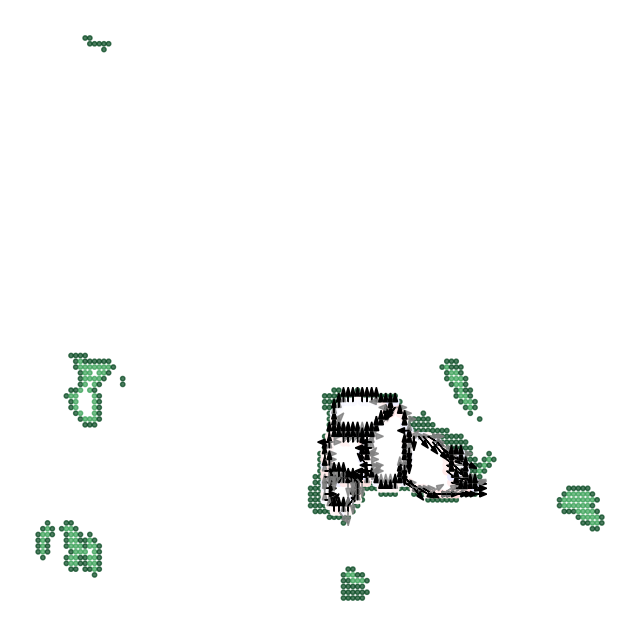

Extracting boundary library from frame 20
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 167
label 2, pixels 2579
label 3, pixels 215
label 4, pixels 1065
label 5, pixels 285
label 6, pixels 2377
label 7, pixels 62
adjusted knn: 14 npts: 58
label 8, pixels 2170
label 9, pixels 1487
label 11, pixels 3169
label 12, pixels 883548
cell 1 state 1 cont

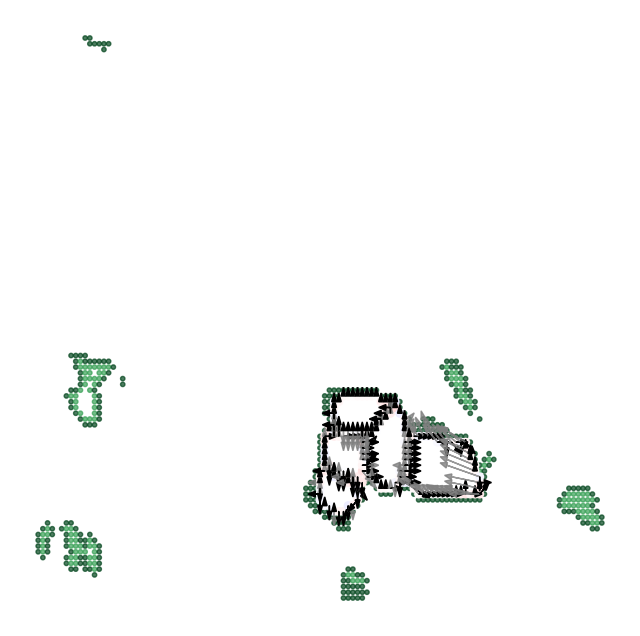

Extracting boundary library from frame 21
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 105
label 2, pixels 74
adjusted knn: 15 npts: 61
label 3, pixels 101
label 4, pixels 2340
label 5, pixels 145
label 6, pixels 1371
label 7, pixels 194
label 8, pixels 2388
label 9, pixels 123
label 1

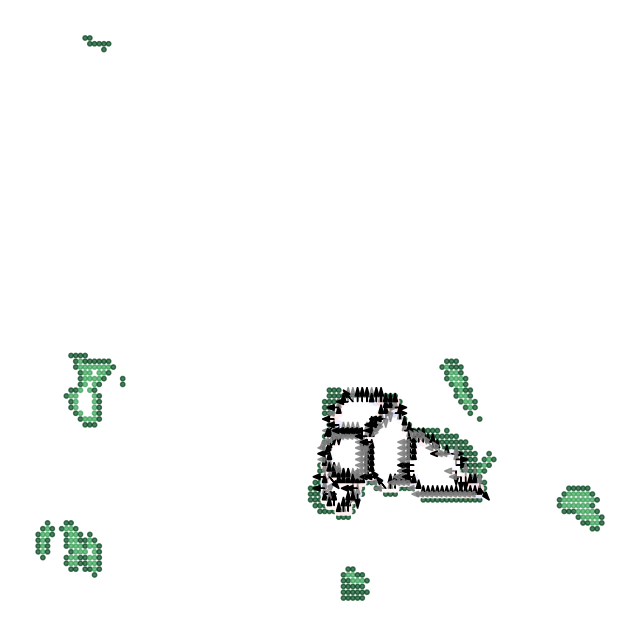

Extracting boundary library from frame 22
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 84
adjusted knn: 17 npts: 69
label 2, pixels 143
label 3, pixels 2319
label 4, pixels 80
adjusted knn: 18 npts: 75
label 5, pixels 218
label 6, pixels 1314
label 7, pixels 191
label 8, pixels 2454
la

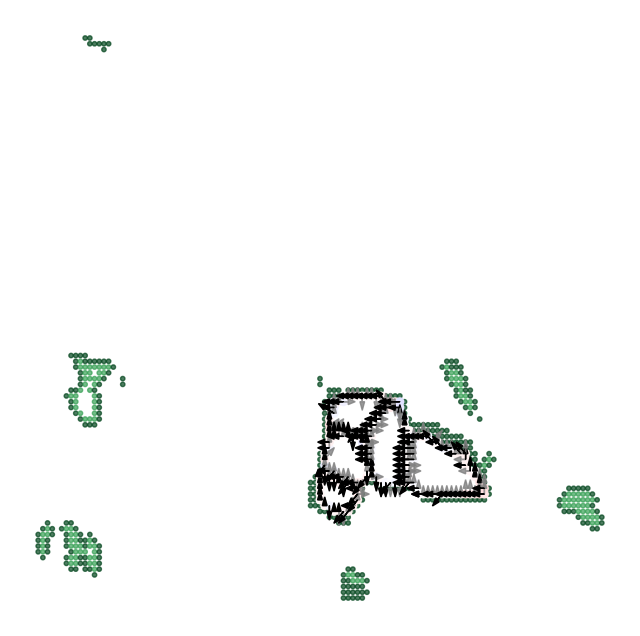

Extracting boundary library from frame 23
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 111
label 2, pixels 70
adjusted knn: 16 npts: 67
label 3, pixels 2210
label 4, pixels 314
label 5, pixels 1425
label 6, pixels 155
label 7, pixels 2233
label 8, pixels 56
adjusted knn: 14 npts: 56
label 9, pixels 2281
label 10, p

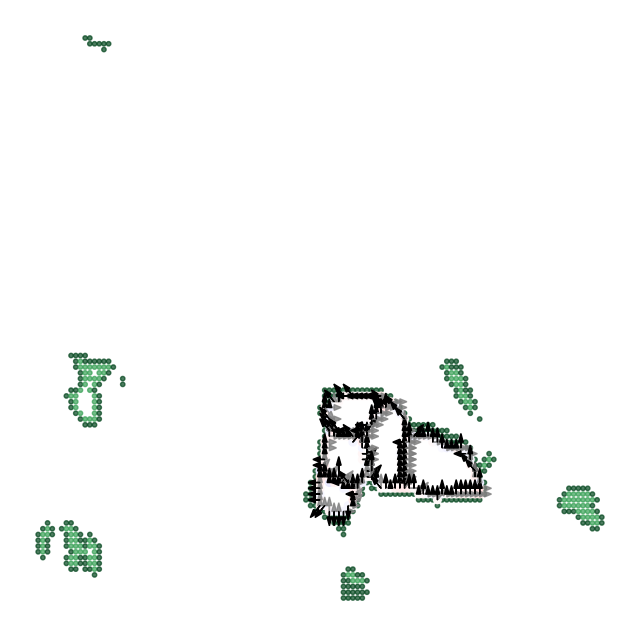

Extracting boundary library from frame 24
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 115
label 2, pixels 80
adjusted knn: 16 npts: 66
label 3, pixels 2215
label 4, pixels 297
label 5, pixels 1702
label 6, pixels 244
label 7, pixels 2116
label 8, pixels 2241
label 9, pixels 1428
label 11, pixels 3179
label 12, pixels 883507
cell 1 state 1 cont

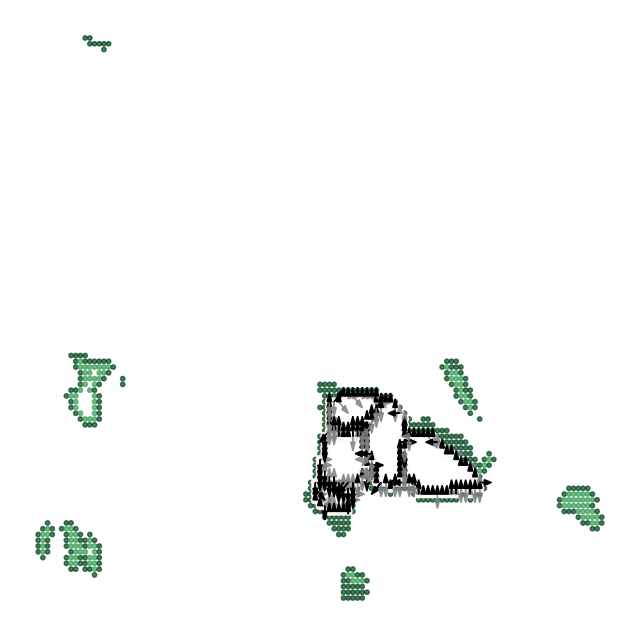

Extracting boundary library from frame 25
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 103
label 2, pixels 81
adjusted knn: 17 npts: 68
label 3, pixels 2114
label 4, pixels 99
label 5, pixels 153
label 6, pixels 1927
label 7, pixels 247
label 8, pixels 2137
label 9, pixels 102
label 10

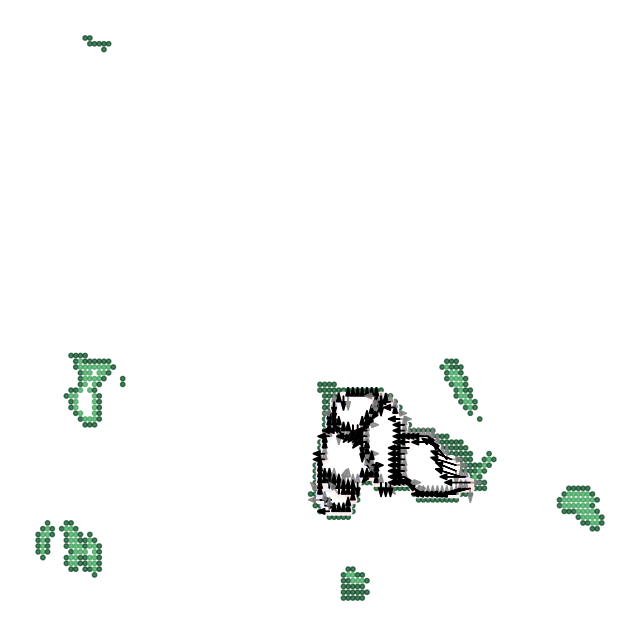

Extracting boundary library from frame 26
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 143
label 2, pixels 74
adjusted knn: 17 npts: 71
label 3, pixels 2252
label 4, pixels 290
label 5, pixels 2029
label 6, pixels 296
label 7, pixels 1923
label 8, pixels 1491
label 9, pixels 1830
label 10, pixels 331
label 12, pixe

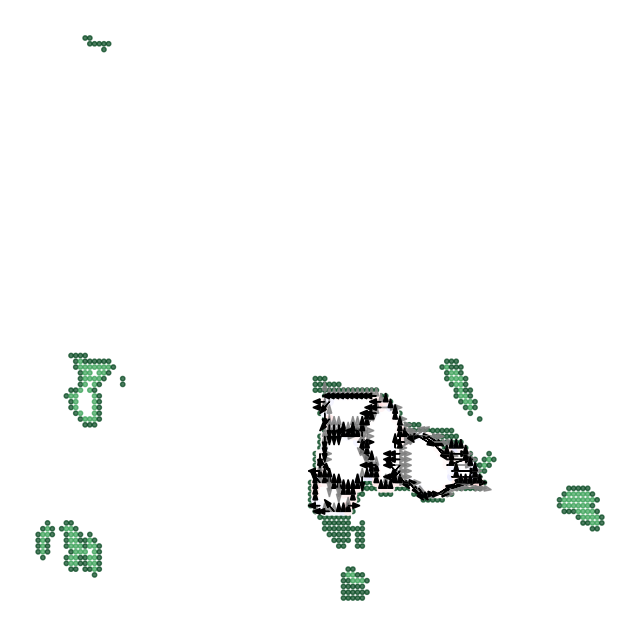

Extracting boundary library from frame 27
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 169
label 2, pixels 2240
label 3, pixels 284
label 4, pixels 324
label 5, pixels 94
label 6, pixels 1907
label 7, pixels 1820
label 8, pixels 1534
label 9, pixels 2246
label 11, pixels 3184
label 12, pixels 883322
cell 1 state 1 contact fraction 0.00
cell 1 s

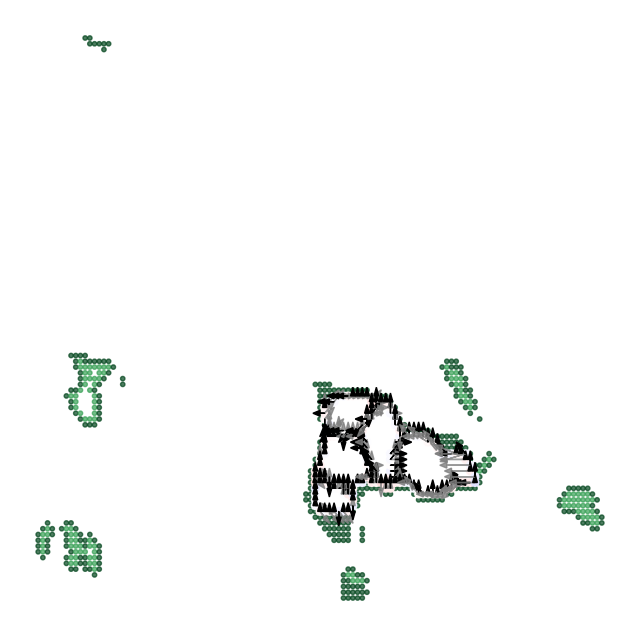

Extracting boundary library from frame 28
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 114
label 2, pixels 86
adjusted knn: 17 npts: 71
label 3, pixels 265
label 4, pixels 2257
label 5, pixels 1821
label 6, pixels 91
label 7, pixels 2057
label 8, pixels 231
label 9, pixels 1487
label 10, pixels 2080
label 12, pixel

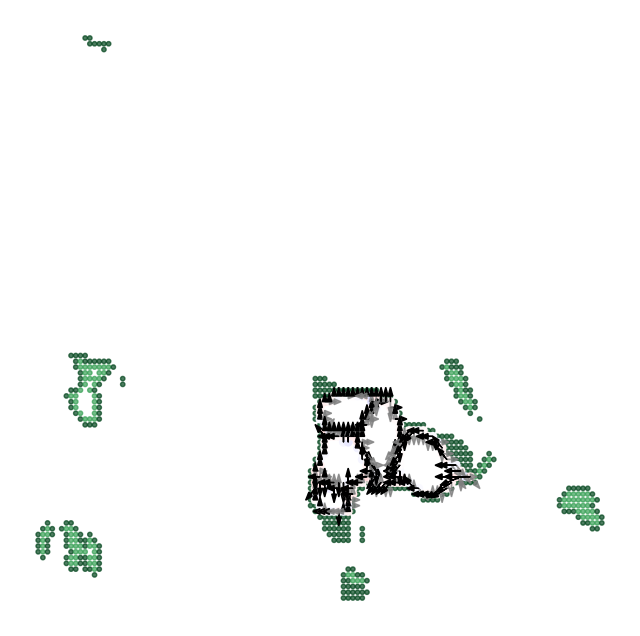

Extracting boundary library from frame 29
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]


KeyboardInterrupt: 

In [135]:
#boundary library test
h5filename=modelList_flat[indgood_surf[0]]
sctm=trajectory.Trajectory(h5filename=h5filename)
sctm.get_image_shape()
print(f'{sctm.nmaskchannels}')
cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
sctm.load_from_h5(f'/cell_data_m{sctm.mskchannel}/')
boundary_library=sctm.get_cellboundary_library(surface_fmask_channels=[4,5],border_resolution=1.33,visual=True,save_h5=False,overwrite=False) #channels 4 and 5 where we put consensus surface

In [136]:
def get_boundarylibrary(h5filename):
    sctm=trajectory.Trajectory(h5filename=h5filename)
    sctm.get_image_shape()
    print(f'{sctm.nmaskchannels}')
    cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
    nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
    foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
    nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
    mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
    sctm.load_from_h5(f'/cell_data_m{sctm.mskchannel}/')
    boundary_library=sctm.get_cellboundary_library(surface_fmask_channels=[4,5],border_resolution=1.33,visual=False,save_h5=True,overwrite=True) #channels 4 and 5 where we put consensus surface

In [ ]:
results = [get_boundarylibrary(h5filename) for h5filename in np.array(modelList_flat)[indgood_surf]]

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5:/cell_data_m0/
Extracting boundary library from frame 0
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
ge

In [146]:
modelSet[16]=sctm

In [ ]:
ray.init()

In [ ]:
#parallel version
results = ray.get([get_cellfeatures_distributed.remote(h5filename) for h5filename in modelList]) #now run in parallel with ray

In [207]:
ray.shutdown()

## load up models and analysis

In [292]:
conditions_files=['20240810_platemap_.xlsx']
nxy=39
import pandas as pd
tmSet=[]
inds_tmSet=np.zeros(nxy).astype(int)
nxySet=[]
for ifile in range(len(conditions_files)):
    conditions_file=conditions_files[ifile]
    dfs = pd.read_excel(conditions_file,header=None)
    nxySet.append(dfs[0].size)
    tmSet_file=np.unique(dfs[1]).tolist()
    tmSet.append(tmSet_file)
    nf=len(tmSet_file)
    for i_tm in range(nf):
        indstm=np.where(dfs[1]==tmSet_file[i_tm])[0]
        inds_tmSet[indstm]=i_tm

inds_tmSet=inds_tmSet.tolist()
tmSet=list(itertools.chain(*tmSet))
print(tmSet)
#inds_tmSet=list(itertools.chain(*inds_tmSet))
print(inds_tmSet)
print(f'specified {np.sum(nxySet)} wells and {len(inds_tmSet)} treatments provided')
cmap=plt.get_cmap('Dark2')
colorSet = cmap(np.linspace(0, 1, len(tmSet)))
#colorSet =np.array(['black','dimgray','lightgrey','purple','mediumorchid','violet','blue','cornflowerblue','lightsteelblue'])

[' FGF2', 'Control', 'ERKi', 'ERKi+MCl1i', 'FGF2+Mcl1i', 'MEKi', 'MEKi+Mcl1i', 'Mcl1i', 'Palbociclib', 'Palbociclib+Mcl1i']
[1, 1, 1, 1, 1, 2, 2, 2, 2, 0, 0, 0, 0, 8, 8, 8, 8, 8, 5, 5, 5, 6, 6, 9, 9, 9, 9, 4, 4, 3, 3, 3, 3, 3, 3, 7, 7, 7, 7]
specified 39 wells and 39 treatments provided


In [297]:
nf=len(tmSet)
inds_imagingSet_models=[]
inds_tmSet_models=[]
modelList=[]
i_tm=0
for idataset in range(len(modelNames)):
    nxy=nxySet[idataset]
    ind_xy=np.arange(nxy).astype(int)
    for ii in range(nxy):
        ixy=ind_xy[ii]
        modelName=modelNames[idataset]
        datapath=datapaths[idataset]
        mlist = imprep.list_images(f'{datapath}/{modelName}_xy{ixy}_roi*.h5')
        for mstring in mlist:
            modelList.append(mstring)
            inds_imagingSet_models.append(inds_imagingSet[ii])
            inds_tmSet_models.append(inds_tmSet[i_tm])
            print(f'found model {mstring} cond: {tmSet[inds_tmSet[i_tm]]}')
        i_tm=i_tm+1
        print(i_tm)

inds_imagingSet_models=np.array(inds_imagingSet_models)
inds_tmSet_models=np.array(inds_tmSet_models)
nmodels=len(modelList)
print(f'{nmodels} models found')

found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 cond: Control
1
found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy1_roi0.h5 cond: Control
2
found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy2_roi0.h5 cond: Control
3
found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy3_roi0.h5 cond: Control
4
found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy4_roi0.h5 cond: Control
5
found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy5_roi0.h5 cond: ERKi
6
found model /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy6_roi0.h5 cond: ERKi
7
found model /home/groups/CEDAR/co

In [298]:
modelSet=[None]*nmodels
indgood_models=np.array([]).astype(int)
for i in range(nmodels): #now go back through and try to load data
    try:
        modelSet[i]=trajectory.Trajectory(h5filename=modelList[i])
        sctm=modelSet[i]
        modelSet[i].get_image_shape()#some missing info, add in to metadata in future
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmsk_channel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel
        #sctm.save_to_h5('/metadata/',['mskchannel'],overwrite=True)
        status=modelSet[i].load_from_h5(f'/cell_data_m{mskchannel}/')
        if status:
            print(f'loaded {sctm.h5filename} with {sctm.mask_channels} mask channels, {sctm.channels} image channels, cell index on {mskchannel}') 
        else:
            print(f'cell info on {mskchannel} not found') 
        if status and np.sum(np.logical_not(np.isfinite(modelSet[i].Xf)))==0:
            print('has morphology features')
            ind_cbc_start=np.where(modelSet[i].Xf_feature_list==b'featBoundaryCB-0_msk0img0_fmsk')[0][0]
            print(f'cb: {np.mean(modelSet[i].Xf[:,ind_cbc_start])}')
            if hasattr(modelSet[i],f'm{mskchannel}_img{nuc_img_channel}img{rep_img_channel}_crosscorr'):
                print('has ERK features')
                if hasattr(modelSet[i],f'm{mskchannel}_img{nuc_img_channel}img{akt_img_channel}_crosscorr'):
                    print('has AKT features')
                    if hasattr(modelSet[i],f'boundary_library'):
                        print('has boundary_library')
                        indgood_models=np.append(indgood_models,i)
                        if hasattr(modelSet[i],f'Xf_death'):
                            print('has death features')
    except Exception as e:
        print(e)
        pass

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5:/cell_data_m0/
loaded /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5 with [b'cyto'] mask channels, [b'CFP' b'Cy5' b'TRITC' b'YFP' b'DAPI' b'BF'] image channels, cell index on 0
has morphology features
cb: 0.39131308173813983
has ERK features
has AKT features
has boundary_library
has death features
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy1_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS

In [299]:
#use this list to check if feature extraction complete
for imodel in inds_missing:
    print(imodel)
    sctm=modelSet[imodel]
    if hasattr(sctm,f'boundary_library'):
        print('has boundary_library')
    if hasattr(sctm,f'm{mskchannel}_img{nuc_img_channel}img{rep_img_channel}_crosscorr'):
        print('has ERK features')
        cc=getattr(sctm,f'm{mskchannel}_img{nuc_img_channel}img{rep_img_channel}_crosscorr')
        if cc.size==sctm.cells_indSet.size:
            print('ERK cratio and cell index the same size')
    if hasattr(sctm,f'm{mskchannel}_img{nuc_img_channel}img{akt_img_channel}_crosscorr'):
        print('has AKT features')
    if hasattr(sctm,'linSet'):
        print('has tracking')

In [302]:
imodel=0
for mstring in modelList:
    print(f'{imodel}: {mstring}')
    imodel=imodel+1

0: /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5
1: /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy1_roi0.h5
2: /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy2_roi0.h5
3: /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy3_roi0.h5
4: /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy4_roi0.h5
5: /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy5_roi0.h5
6: /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy6_roi0.h5
7: /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy7_roi0.h5
8: /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS

In [303]:
#trim out models with bad surface extraction after manual validation
indbad_surf=np.array([13,17,1,26,27,28,2,31,32,34,35,39,6,7]).astype(int)
indgood_surf=np.setdiff1d(np.arange(nmodels).astype(int),indbad_surf)
indgood_models=np.setdiff1d(indgood_models,indbad_surf)
print(indgood_models)

[ 0  3  4  5  8  9 10 11 12 14 15 16 18 19 20 21 22 23 24 25 29 30 33 36
 37 38 40]


### Review and trim tracks by optimal transport cost

re-tracking /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5
re-tracking /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy3_roi0.h5
re-tracking /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy4_roi0.h5
re-tracking /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy5_roi0.h5
re-tracking /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy7_roi1.h5
re-tracking /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy8_roi0.h5
re-tracking /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy9_roi0.h5
re-tracking /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy10_roi0.h5
re-tracking /ho

Text(0.5, 0, 'OT EMD')

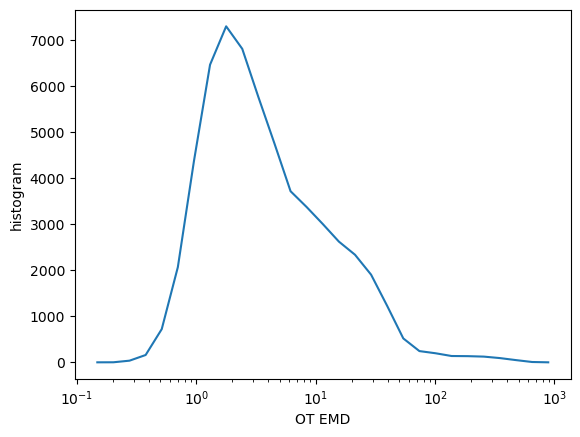

In [304]:
#review histogram of OT EMD costs to choose cutoff
ot_costs=[[np.inf]]*(np.max(indgood_models)+1)
linSets=[None]*(np.max(indgood_models)+1)
#cells_nchildren=[None]*(np.max(indgood_models)+1)
for i in indgood_models:
    print(f're-tracking {modelSet[i].h5filename}')
    sctm=modelSet[i]
    #ot_costs[i],linSets[i]=sctm.get_lineage_min_otcost(distcut=0.5*sctm.cellpose_diam,return_cost=True,ot_cost_cut=np.inf,border_resolution=1.33,visual=False,save_h5=True,overwrite=True)
    ot_costs[i]=sctm.ot_tracking_costs.copy()
    linSets[i]=sctm.linSet.copy()
    #cells_nchildren[i]=sctm.get_cells_nchildren()

ot_costs_all=np.concatenate(ot_costs)
#cells_nchildren_all=np.concatenate(cells_nchildren)
ot_hist,bins=np.histogram(ot_costs_all[np.isfinite(ot_costs_all)],bins=np.logspace(-3,10,num=30,base=2))
plt.plot(.5*bins[0:-1]+.5*bins[1:],ot_hist)
plt.xscale('log')
plt.ylabel('histogram')
plt.xlabel('OT EMD')

In [ ]:
#review tracks and segmentations by optimal control EMD (earth movers distance) metric, you can use this to help set the cutoff value ot_cut
trajl_future=0
trajl_past=1
fu=np.max(sctm.cells_frameSet-trajl_future)
fl=trajl_past
min_traj_len=1
min_size=sctm.cellpose_diam*sctm.cellpose_diam
#i_tm=np.where(np.array(tmSet)=='ctrl')[0][0]
#indmodels=np.where(inds_tmSet_models==i_tm)[0]
indmodels=indgood_models.copy()
indmodels=np.intersect1d(indmodels,indgood_models)
vals_seg_set=[None]*indmodels.size
inds_seg_set=[None]*indmodels.size
vals_track_set=[None]*indmodels.size
ot_cut=10.0
for iimodel in [1]: #range(indmodels.size):
    imodel=indmodels[iimodel]
    sctm_fate=modelSet[imodel]
    inds_track=np.where(np.logical_and(sctm_fate.ot_tracking_costs>ot_cut,np.isfinite(sctm_fate.ot_tracking_costs)))[0]
    inds_sort=np.argsort(sctm_fate.ot_tracking_costs[inds_track])
    #inds_track=np.flip(inds_track[inds_sort])
    inds_track=inds_track[inds_sort]
    indstw=np.where(np.logical_and(sctm_fate.cells_frameSet[inds_track]<fu,sctm_fate.cells_frameSet[inds_track]>fl))[0]
    inds_track=inds_track[indstw]
    print(inds_track)
    print(sctm_fate.cells_frameSet[inds_track])
    trackval_dir=f'./{date}/trackot_val_m{imodel}/'
    os.system(f'mkdir {trackval_dir}')
    vals_seg_set[iimodel],inds_seg_set[iimodel],vals_track_set[iimodel]=sctm_fate.manual_fate_validation(inds_track,'seg',restart=False,val_tracks=True,trajl_past=trajl_past,trajl_future=trajl_future,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,projection=True,msk_channel=cyto_msk_channel,pathto=trackval_dir,save_pic=True,boundary_expansion=[2,70,70],nuclow=90,save_h5=False,overwrite=False)

In [154]:
#break tracks based upon optimal transport EMD metric
ot_cut=10.0
for i in indgood_models:
    sctm=modelSet[i]
    inds_break=np.where(sctm.ot_tracking_costs>ot_cut)[0]
    print(f'breaking {inds_break.size} tracks from {modelSet[i].h5filename}')
    for ic in inds_break:
        iS=sctm.cells_frameSet[ic]
        sctm.linSet[iS][sctm.cells_indSet[ic]]=-1

breaking 169 tracks from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5
breaking 626 tracks from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy12_roi0.h5
breaking 352 tracks from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy13_roi0.h5
breaking 444 tracks from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy14_roi0.h5
breaking 539 tracks from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy17_roi0.h5
breaking 1078 tracks from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy18_roi0.h5
breaking 940 tracks from /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy19_roi0.h5
breaking 433 tracks from /home/groups/CED

In [305]:
#Map all trajectories
all_trajSet=[None]*nmodels
for i in indgood_models:
    print(f'tracing trajectories for {modelSet[i].h5filename}')
    modelSet[i].get_unique_trajectories()
    all_trajSet[i]=modelSet[i].trajectories.copy()

tracing trajectories for /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy0_roi0.h5
tracked cell 624, 3 tracks, 300 left
tracked cell 4, 1 tracks, 0 left
tracing trajectories for /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy3_roi0.h5
tracked cell 3826, 1 tracks, 2700 left
tracked cell 3792, 55 tracks, 2600 left
tracked cell 2840, 1 tracks, 1900 left
tracked cell 2665, 1 tracks, 1800 left
tracked cell 2437, 1 tracks, 1700 left
tracked cell 1947, 1 tracks, 1100 left
tracked cell 1386, 2 tracks, 700 left
tracked cell 1223, 6 tracks, 600 left
tracked cell 677, 1 tracks, 300 left
tracked cell 2, 1 tracks, 0 left
tracing trajectories for /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy4_roi0.h5
tracked cell 1900, 1 tracks, 1200 left
tracked cell 1313, 16 tracks, 800 left
tracked cell 989, 2 tracks, 600 left
tracked cell 857, 33 track

### validate deaths

In [208]:
#print(modelSet[18].inds_death)
np.where(indgood_models==18)

(array([12]),)

In [209]:
trajl_future=4
trajl_past=1
fu=np.max(sctm.cells_frameSet-trajl_future)
fl=trajl_past
min_traj_len=5
stride=4
min_size=sctm.cellpose_diam*sctm.cellpose_diam
#i_tm=np.where(np.array(tmSet)=='ctrl')[0][0]
#indmodels=np.where(inds_tmSet_models==i_tm)[0]
indmodels=indgood_models.copy()
indmodels=np.intersect1d(indmodels,indgood_models)
vals_death_set=[None]*indmodels.size
inds_death_set=[None]*indmodels.size
for iimodel in [12]: #range(indmodels.size):
    imodel=indmodels[iimodel]
    sctm_fate=modelSet[imodel]
    inds_last=np.array([]).astype(int)
    for itraj in range(len(sctm_fate.trajectories)):
        ic_last=sctm_fate.trajectories[itraj][-1]
        if sctm_fate.cells_frameSet[ic_last] != np.max(sctm_fate.cells_frameSet) and sctm_fate.trajectories[itraj].size>min_traj_len:
            imgc_test,mskc_relabeled=sctm_fate.get_cell_data(ic_last,relabel_mskchannels=[cyto_msk_channel])
            size=np.sum(mskc_relabeled[...,cyto_msk_channel]==ic_last)
            print(f'cell {ic_last} size {size}, {itraj}/{len(sctm_fate.trajectories)}')
            if size>min_size:
                inds_last=np.append(inds_last,ic_last)
    indstw=np.where(np.logical_and(sctm_fate.cells_frameSet[inds_last]<fu,sctm_fate.cells_frameSet[inds_last]>fl))[0]
    inds_last=inds_last[indstw]
    print(inds_last)
    print(sctm_fate.cells_frameSet[inds_last])
    deathval_dir=f'./{date}/death_val_m{imodel}/'
    os.system(f'mkdir {deathval_dir}')
    vals_death_set[iimodel],inds_death_set[iimodel]=sctm_fate.manual_fate_validation(inds_last,'death',restart=False,val_tracks=False,trajl_past=trajl_past,trajl_future=trajl_future,stride=stride,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,projection=True,msk_channel=cyto_msk_channel,pathto=deathval_dir,save_pic=True,boundary_expansion=[3,70,70],nuclow=90,save_h5=True,overwrite=True)

saving attributes ['inds_death', 'vals_death', 'indreviewed_death'] to /cell_data_m0/ in /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy26_roi0.h5
saved inds_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy26_roi0.h5//cell_data_m0/
saved vals_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy26_roi0.h5//cell_data_m0/
saved indreviewed_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy26_roi0.h5//cell_data_m0/


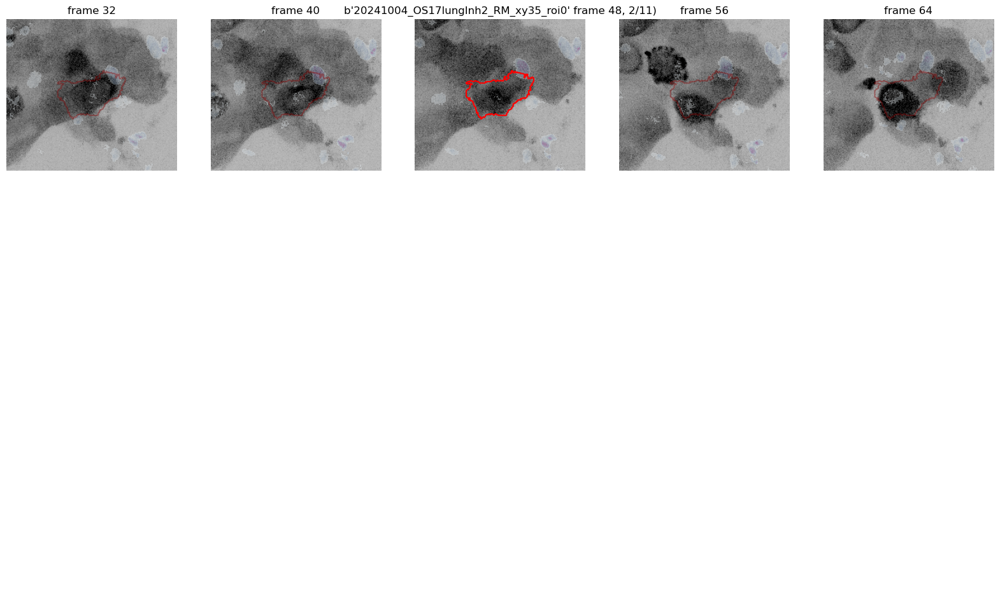

fate validation (q to quit, -1 can't tell, 0 not fate, 1 is fate):
 q


saving attributes ['inds_death', 'vals_death', 'indreviewed_death'] to /cell_data_m0/ in /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy35_roi0.h5
overwrote existing and saved inds_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy35_roi0.h5//cell_data_m0/
overwrote existing and saved vals_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy35_roi0.h5//cell_data_m0/
overwrote existing and saved indreviewed_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy35_roi0.h5//cell_data_m0/


In [489]:
#review deaths again for a model, this does not save
imodel=1
inds_death=inds_death_set[imodel]
sctm_fate=modelSet[imodel]
deathval_dir=f'./{date}/death_test_m{imodel}/'
os.system(f'mkdir {deathval_dir}')
inds_test,vals_test=sctm_fate.manual_fate_validation(inds_death,'death',show_allcells=False,show_linked=False,val_tracks=False,restart=False,trajl_past=2,trajl_future=2,stride=8,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,projection=True,msk_channel=cyto_msk_channel,pathto=deathval_dir,save_pic=True,boundary_expansion=[2,70,70],nuclow=90,save_h5=False,overwrite=False)

### randomly review segmentation and tracking to determine performance

In [490]:
trajl_future=0
trajl_past=1
fu=np.max(sctm.cells_frameSet-trajl_future)
fl=trajl_past
min_traj_len=1
min_size=sctm.cellpose_diam*sctm.cellpose_diam
#i_tm=np.where(np.array(tmSet)=='ctrl')[0][0]
#indmodels=np.where(inds_tmSet_models==i_tm)[0]
indmodels=indgood_models.copy()
indmodels=np.intersect1d(indmodels,indgood_models)
vals_seg_set=[None]*indmodels.size
inds_seg_set=[None]*indmodels.size
vals_track_set=[None]*indmodels.size
n_val=20
for iimodel in range(indmodels.size):
    imodel=indmodels[iimodel]
    sctm_fate=modelSet[imodel]
    indstw=np.where(np.logical_and(sctm.cells_frameSet<fu,sctm.cells_frameSet>fl))[0]
    inds_random = np.random.choice(indstw.size, n_val, replace=False)
    inds_test=indstw[inds_random]
    trackval_dir=f'./{date}/track_val_m{imodel}/'
    os.system(f'mkdir {trackval_dir}')
    print(f'validating {n_val} segs and tracks for {sctm.figid}, writing results to {trackval_dir}')
    vals_seg_set[iimodel],inds_seg_set[iimodel],vals_track_set[iimodel]=sctm_fate.manual_fate_validation(inds_track,'seg',restart=False,val_tracks=True,trajl_past=trajl_past,trajl_future=trajl_future,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,projection=False,msk_channel=cyto_msk_channel,pathto=trackval_dir,save_pic=True,boundary_expansion=[2,70,70],nuclow=90,save_h5=False,overwrite=False)

[ 257 2143 1260 2059 2315 2061 1631  303  207  280 3588 2381 2566 1523
 1196 2103 2198 2924  575 3585 2625 2346  529 3286 3315  621 1984 2199
 1860 2852 1863 1121  706  315 1871  190  132 1320 3136  222  366 1940
 2521  179 1970 1180 1556 1932  708 1105 2244  834  306  267  262 1186
 1768  494 1306  949 1097 1303  136  430 3449 2871 1304 3277 3362 3485
 2012 1979 2491 1972 2757 1913 1678  364  363  540 1555 2651 1602 1103
 2585  606 2523  687]
[ 5 51 29 49 55 49 38  6  4  6 94 57 63 36 28 50 52 73 12 94 65 56 11 84
 85 13 47 52 44 71 44 26 15  6 44  4  2 31 79  4  7 46 61  3 46 27 36 45
 15 25 53 18  6  5  5 28 41 10 30 21 25 30  2  9 89 71 30 84 86 91 47 47
 60 46 68 45 39  7  7 11 36 65 38 25 63 13 61 15]


mkdir: cannot create directory ‘./21nov24/track_val_m1/’: File exists


IndexError: index -2 is out of bounds for axis 0 with size 1

### validate divisions

[81, 82]


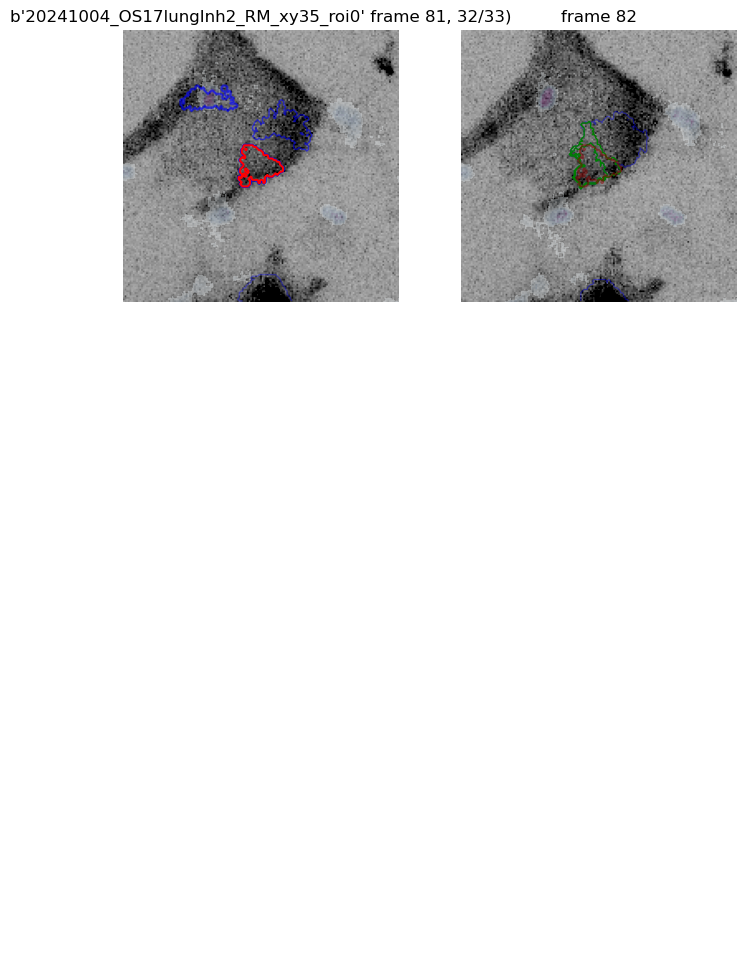

track validation (1 all good, -2 to break past link, 2 to break future link, 0 to break both):
 1
fate validation (q to quit, -1 can't tell, 0 not fate, 1 is fate):
 1


In [349]:
trajl_future=1
trajl_past=0
fu=np.max(sctm.cells_frameSet-trajl_future)
fl=trajl_past
min_traj_len=1
#i_tm=np.where(np.array(tmSet)=='ctrl')[0][0]
#indmodels=np.where(inds_tmSet_models==i_tm)[0]
indmodels=indgood_models.copy()
indmodels=np.intersect1d(indmodels,indgood_models)
vals_div_set=[None]*indmodels.size
inds_div_set=[None]*indmodels.size
vals_div_track_set=[None]*indmodels.size
for iimodel in [1]: #range(indmodels.size):
    imodel=indmodels[iimodel]
    sctm_fate=modelSet[imodel]
    cells_nchildren=sctm_fate.get_cells_nchildren()
    inds_div=np.where(cells_nchildren>1)[0]
    indstw=np.where(np.logical_and(sctm_fate.cells_frameSet[inds_div]<fu,sctm_fate.cells_frameSet[inds_div]>fl))[0]
    inds_div=inds_div[indstw]
    print(inds_div)
    print(sctm_fate.cells_frameSet[inds_div])
    div_val_dir=f'./{date}/div_val_m{imodel}/'
    os.system(f'mkdir {div_val_dir}')
    vals_div_set[iimodel],inds_div_set[iimodel],vals_div_track_set[iimodel]=sctm_fate.manual_fate_validation(inds_div,'div',restart=False,val_tracks=True,trajl_past=trajl_past,trajl_future=trajl_future,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,projection=True,msk_channel=cyto_msk_channel,pathto=div_val_dir,save_pic=True,boundary_expansion=[2,70,70],nuclow=90,save_h5=False,overwrite=False)

### death / persistors analysis

In [306]:
indmodels_death=indgood_models.copy()
print(np.array(tmSet)[inds_tmSet_models[indmodels_death]])

['Control' 'Control' 'Control' 'ERKi' 'ERKi' 'ERKi' ' FGF2' ' FGF2'
 ' FGF2' 'Palbociclib' 'Palbociclib' 'Palbociclib' 'Palbociclib' 'MEKi'
 'MEKi' 'MEKi' 'MEKi+Mcl1i' 'MEKi+Mcl1i' 'Palbociclib+Mcl1i'
 'Palbociclib+Mcl1i' 'FGF2+Mcl1i' 'ERKi+MCl1i' 'ERKi+MCl1i' 'Mcl1i'
 'Mcl1i' 'Mcl1i' 'Mcl1i']


In [307]:
for i in indgood_models:
    sctm=modelSet[i]
    print(f'model {i} {sctm.figid} condition {tmSet[inds_tmSet_models[i]]} with {sctm.inds_death.size} deaths')

model 0 b'20241004_OS17lungInh2_RM_xy0_roi0' condition Control with 0 deaths
model 3 b'20241004_OS17lungInh2_RM_xy3_roi0' condition Control with 0 deaths
model 4 b'20241004_OS17lungInh2_RM_xy4_roi0' condition Control with 4 deaths
model 5 b'20241004_OS17lungInh2_RM_xy5_roi0' condition ERKi with 3 deaths
model 8 b'20241004_OS17lungInh2_RM_xy7_roi1' condition ERKi with 0 deaths
model 9 b'20241004_OS17lungInh2_RM_xy8_roi0' condition ERKi with 0 deaths
model 10 b'20241004_OS17lungInh2_RM_xy9_roi0' condition  FGF2 with 3 deaths
model 11 b'20241004_OS17lungInh2_RM_xy10_roi0' condition  FGF2 with 5 deaths
model 12 b'20241004_OS17lungInh2_RM_xy11_roi0' condition  FGF2 with 18 deaths
model 14 b'20241004_OS17lungInh2_RM_xy13_roi0' condition Palbociclib with 0 deaths
model 15 b'20241004_OS17lungInh2_RM_xy14_roi0' condition Palbociclib with 2 deaths
model 16 b'20241004_OS17lungInh2_RM_xy15_roi0' condition Palbociclib with 1 deaths
model 18 b'20241004_OS17lungInh2_RM_xy17_roi0' condition Palbocicli

In [308]:
#image features stored in sctm.Xf, often Zernike polynomials, texture, shape, environment, etc
#print(modelSet[indgood_models[0]].Xf_feature_list)
ilast=np.where(modelSet[indgood_models[0]].Xf_feature_list==b'featBoundaryCB-14_msk0img0_fmsk')[0][0]
#print(modelSet[indgood_models[0]].Xf_feature_list[0:ilast])
indkeep_features=np.arange(ilast) #modelSet[indgood_models[0]].Xf.shape[1]).astype(int)
Xf_feature_list=modelSet[indgood_models[0]].Xf_feature_list[indkeep_features]
nfeat=indkeep_features.size
Xf=np.zeros((0,nfeat))
indtreatment=np.array([]).astype(int)
indcellSet=np.array([]).astype(int)
indcells_models=np.array([]).astype(int)
indframes=[]
for i in indgood_models:
    Xf=np.append(Xf,modelSet[i].Xf[:,indkeep_features],axis=0)
    indtreatment=np.append(indtreatment,inds_tmSet_models[i]*np.ones(modelSet[i].Xf.shape[0]).astype(int))
    indcellSet=np.append(indcellSet,modelSet[i].cells_indSet)
    indcells_models=np.append(indcells_models,i*np.ones(modelSet[i].Xf.shape[0]).astype(int))
    indframes.append(modelSet[i].cells_frameSet)

indframes=np.concatenate(indframes)

In [309]:
#signaling features
cratio_erk=np.array([]).astype(float)
for i in indmodels_death:
    sctm=modelSet[i]
    attr_str=f'img{erk_img_channel}_m{sctm.mskchannel}m{nuc_fmsk_channel}_ratio'
    cc=getattr(sctm,attr_str)
    cratio_erk=np.append(cratio_erk,cc)
    modelSet[i].x_signal=cc.copy()

cratio_erk_std=np.std(cratio_erk);cratio_erk_mean=np.mean(cratio_erk);#cratio_erk=imprep.znorm(cratio_erk)

In [310]:
#signaling features
cratio_akt=np.array([]).astype(float)
for i in indmodels_death:
    sctm=modelSet[i]
    attr_str=f'img{akt_img_channel}_m{sctm.mskchannel}m{nuc_fmsk_channel}_ratio'
    cc=getattr(sctm,attr_str)
    cratio_akt=np.append(cratio_akt,cc)
    modelSet[i].x_signal_akt=cc.copy()

cratio_akt_std=np.std(cratio_akt);cratio_akt_mean=np.mean(cratio_akt);#cratio_erk=imprep.znorm(cratio_erk)

In [174]:
nf

10

In [214]:
def get_death_erk_info(indmodels_death,modelSet):
    plt.figure()
    erk_trajs_death=[]
    for imodel in indmodels_death:
        sctm=modelSet[imodel]
        if not hasattr(sctm,'inds_death'):
            print(f'model {imodel} has no inds_death')
        print(f'{imodel} with {sctm.inds_death.size} deaths')
        for ideath in range(sctm.inds_death.size):
            ic=sctm.inds_death[ideath]
            cell_traj=sctm.get_cell_trajectory(ic)
            print(f'cell death at frame {sctm.cells_frameSet[ic]} traced for {cell_traj.size} frames')
            frames=sctm.cells_frameSet[cell_traj]
            erk_traj=sctm.x_signal[cell_traj]
            xtraj=np.ones(sctm.nt)*np.nan
            xtraj[frames]=erk_traj
            erk_trajs_death.append(xtraj)
            plt.plot(frames,erk_traj,color='black')
    
    erk_trajs_persist=[]
    for imodel in indmodels_death:
        sctm=modelSet[imodel]
        inds_persistors=np.where(sctm.cells_frameSet==np.max(sctm.cells_frameSet))[0]
        for ipersist in range(inds_persistors.size):
            ic=inds_persistors[ipersist]
            cell_traj=sctm.get_cell_trajectory(ic)
            print(f'cell persistor at frame {sctm.cells_frameSet[ic]} traced for {cell_traj.size} frames')
            frames=sctm.cells_frameSet[cell_traj]
            erk_traj=sctm.x_signal[cell_traj]
            xtraj=np.ones(sctm.nt)*np.nan
            xtraj[frames]=erk_traj
            erk_trajs_persist.append(xtraj)
            plt.plot(frames,erk_traj,color='red')
    
    erk_initial=np.array([])
    for imodel in indmodels_death:
        sctm=modelSet[imodel]
        inds_initial=np.where(sctm.cells_frameSet==0)[0]
        erk_initial=np.append(erk_initial,sctm.x_signal[inds_initial])
    
    erk_initial=np.array(erk_initial)
    plt.scatter(np.zeros_like(erk_initial),erk_initial,s=20,c='green',marker='o')
    plt.close()
    
    erk_trajs_persist=np.array(erk_trajs_persist)
    if erk_trajs_persist.size==0:
        erk_trajs_persist=np.zeros((0,0))
    erk_trajs_death=np.array(erk_trajs_death)
    if erk_trajs_death.size==0:
        erk_trajs_death=np.zeros((0,0))
    erk_initial=np.array(erk_initial)
    return erk_trajs_persist,erk_trajs_death,erk_initial

In [311]:
date='19dec25'
os.system(f'mkdir {date}')

mkdir: cannot create directory ‘19dec25’: File exists


256



 FGF2 with 3 models and 83 cells


10 with 3 deaths
cell death at frame 86 traced for 74 frames
cell death at frame 79 traced for 67 frames
cell death at frame 76 traced for 11 frames
11 with 5 deaths
cell death at frame 48 traced for 36 frames
cell death at frame 39 traced for 40 frames
cell death at frame 38 traced for 39 frames
cell death at frame 29 traced for 30 frames
cell death at frame 8 traced for 9 frames
12 with 18 deaths
cell death at frame 91 traced for 92 frames
cell death at frame 90 traced for 81 frames
cell death at frame 77 traced for 78 frames
cell death at frame 69 traced for 10 frames
cell death at frame 60 traced for 61 frames
cell death at frame 59 traced for 8 frames
cell death at frame 55 traced for 56 frames
cell death at frame 45 traced for 46 frames
cell death at frame 44 traced for 45 frames
cell death at frame 22 traced for 23 frames
cell death at frame 20 traced for 21 frames
cell death at frame 20 traced for 20 frames
cell death at frame 17 traced for 

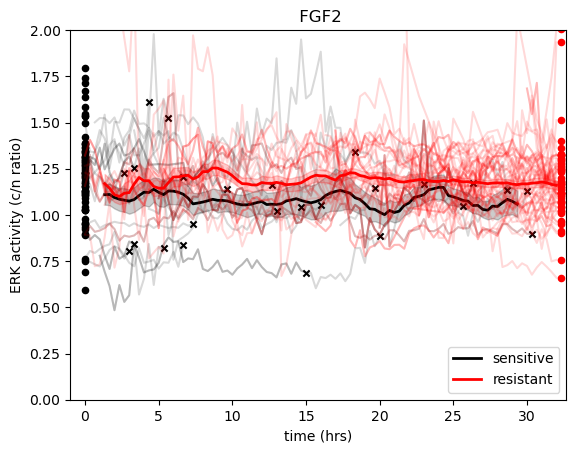



Control with 3 models and 78 cells


0 with 0 deaths
3 with 0 deaths
4 with 4 deaths
cell death at frame 86 traced for 70 frames
cell death at frame 36 traced for 37 frames
cell death at frame 12 traced for 6 frames
cell death at frame 11 traced for 12 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 35 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 35 frames
cell persistor at frame 96 traced for 65 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 35 frames
cell persistor at frame 96 traced for 57 frames
cell persistor at frame 96 traced for 3 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 34 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 3 frames
cell persistor at frame 96 traced for 2 frames
cell persistor at fra

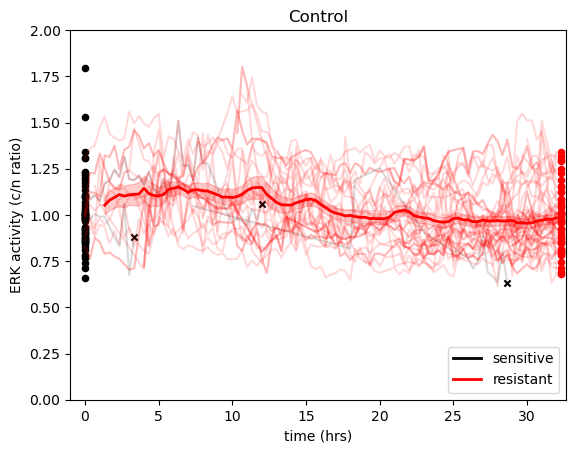



ERKi with 3 models and 95 cells


5 with 3 deaths
cell death at frame 84 traced for 76 frames
cell death at frame 82 traced for 83 frames
cell death at frame 58 traced for 59 frames
8 with 0 deaths
9 with 0 deaths
cell persistor at frame 96 traced for 88 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 59 frames
cell persistor at frame 96 traced for 21 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 52 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 87 frames
cell persistor at frame 96 traced for 38 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 10 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor a

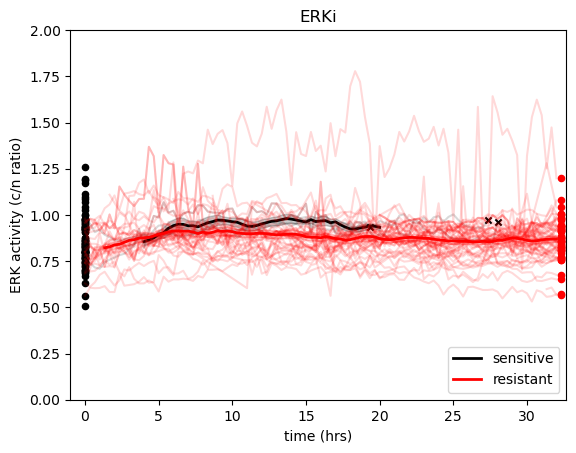



ERKi+MCl1i with 2 models and 69 cells


30 with 7 deaths
cell death at frame 75 traced for 76 frames
cell death at frame 68 traced for 55 frames
cell death at frame 66 traced for 67 frames
cell death at frame 65 traced for 66 frames
cell death at frame 48 traced for 49 frames
cell death at frame 18 traced for 19 frames
cell death at frame 17 traced for 18 frames
33 with 16 deaths
cell death at frame 89 traced for 83 frames
cell death at frame 57 traced for 58 frames
cell death at frame 56 traced for 50 frames
cell death at frame 51 traced for 52 frames
cell death at frame 51 traced for 52 frames
cell death at frame 51 traced for 6 frames
cell death at frame 51 traced for 52 frames
cell death at frame 51 traced for 52 frames
cell death at frame 50 traced for 51 frames
cell death at frame 44 traced for 45 frames
cell death at frame 38 traced for 39 frames
cell death at frame 38 traced for 39 frames
cell death at frame 37 traced for 38 frames
cell death at frame 36 traced for 37 frames


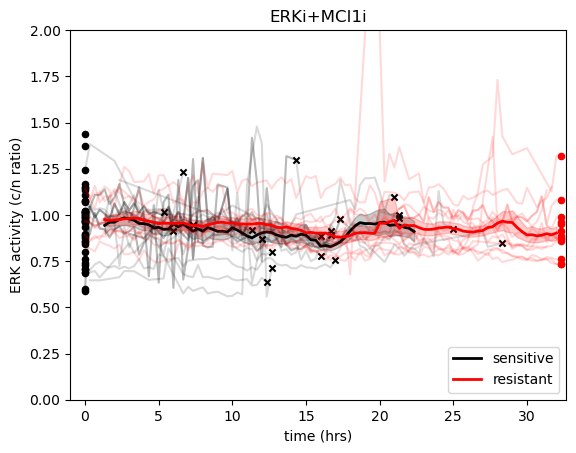



FGF2+Mcl1i with 1 models and 16 cells


29 with 1 deaths
cell death at frame 81 traced for 21 frames
cell persistor at frame 96 traced for 5 frames
cell persistor at frame 96 traced for 26 frames
cell persistor at frame 96 traced for 14 frames
cell persistor at frame 96 traced for 14 frames
cell persistor at frame 96 traced for 1 frames
cell persistor at frame 96 traced for 14 frames
cell persistor at frame 96 traced for 7 frames
cell persistor at frame 96 traced for 11 frames
cell persistor at frame 96 traced for 4 frames
cell persistor at frame 96 traced for 6 frames
cell persistor at frame 96 traced for 6 frames
cell persistor at frame 96 traced for 1 frames
cell persistor at frame 96 traced for 5 frames


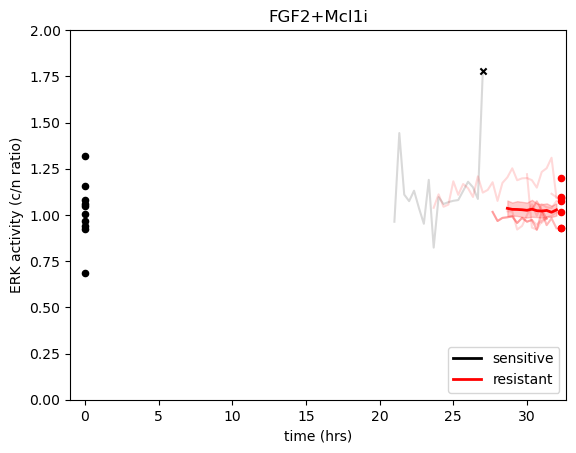



MEKi with 3 models and 154 cells


19 with 17 deaths
cell death at frame 83 traced for 60 frames
cell death at frame 76 traced for 77 frames
cell death at frame 64 traced for 21 frames
cell death at frame 64 traced for 20 frames
cell death at frame 61 traced for 62 frames
cell death at frame 57 traced for 58 frames
cell death at frame 54 traced for 46 frames
cell death at frame 54 traced for 55 frames
cell death at frame 44 traced for 36 frames
cell death at frame 42 traced for 43 frames
cell death at frame 42 traced for 43 frames
cell death at frame 27 traced for 26 frames
cell death at frame 27 traced for 28 frames
cell death at frame 16 traced for 17 frames
cell death at frame 14 traced for 15 frames
cell death at frame 11 traced for 12 frames
cell death at frame 10 traced for 11 frames
20 with 4 deaths
cell death at frame 89 traced for 11 frames
cell death at frame 65 traced for 66 frames
cell death at frame 55 traced for 56 frames
cell death at frame 48 traced for 49 frames
21 w

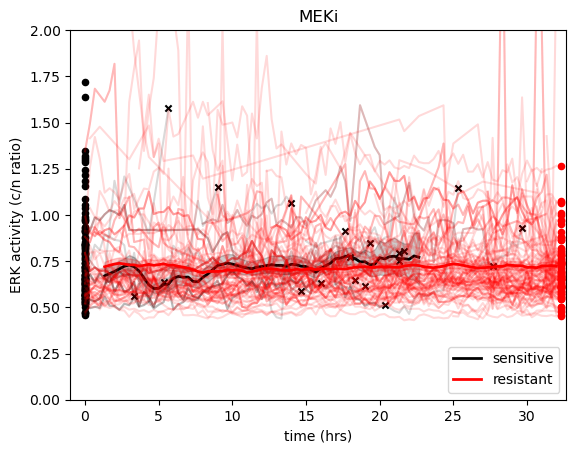



MEKi+Mcl1i with 2 models and 67 cells


22 with 30 deaths
cell death at frame 84 traced for 30 frames
cell death at frame 76 traced for 8 frames
cell death at frame 73 traced for 71 frames
cell death at frame 68 traced for 10 frames
cell death at frame 67 traced for 68 frames
cell death at frame 67 traced for 7 frames
cell death at frame 64 traced for 65 frames
cell death at frame 64 traced for 10 frames
cell death at frame 59 traced for 57 frames
cell death at frame 59 traced for 29 frames
cell death at frame 58 traced for 47 frames
cell death at frame 58 traced for 12 frames
cell death at frame 58 traced for 47 frames
cell death at frame 58 traced for 59 frames
cell death at frame 56 traced for 57 frames
cell death at frame 54 traced for 55 frames
cell death at frame 54 traced for 55 frames
cell death at frame 53 traced for 6 frames
cell death at frame 53 traced for 54 frames
cell death at frame 53 traced for 54 frames
cell death at frame 50 traced for 51 frames
cell death at frame

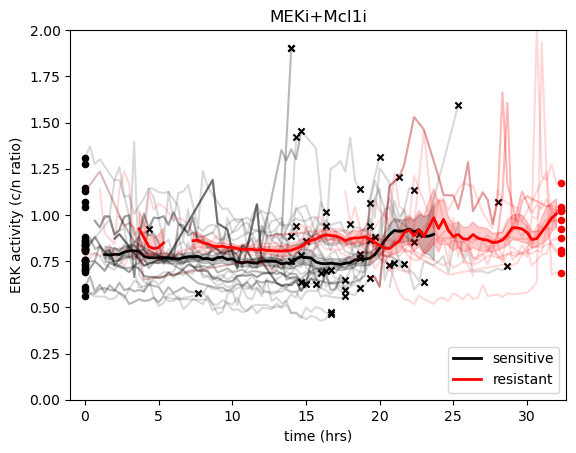



Mcl1i with 4 models and 78 cells


36 with 7 deaths
cell death at frame 82 traced for 66 frames
cell death at frame 48 traced for 39 frames
cell death at frame 44 traced for 39 frames
cell death at frame 43 traced for 44 frames
cell death at frame 31 traced for 32 frames
cell death at frame 29 traced for 30 frames
cell death at frame 24 traced for 23 frames
37 with 1 deaths
cell death at frame 45 traced for 46 frames
38 with 17 deaths
cell death at frame 77 traced for 23 frames
cell death at frame 76 traced for 77 frames
cell death at frame 64 traced for 65 frames
cell death at frame 62 traced for 63 frames
cell death at frame 61 traced for 62 frames
cell death at frame 54 traced for 55 frames
cell death at frame 52 traced for 53 frames
cell death at frame 50 traced for 51 frames
cell death at frame 48 traced for 49 frames
cell death at frame 48 traced for 49 frames
cell death at frame 48 traced for 49 frames
cell death at frame 41 traced for 42 frames
cell death at frame 31 traced f

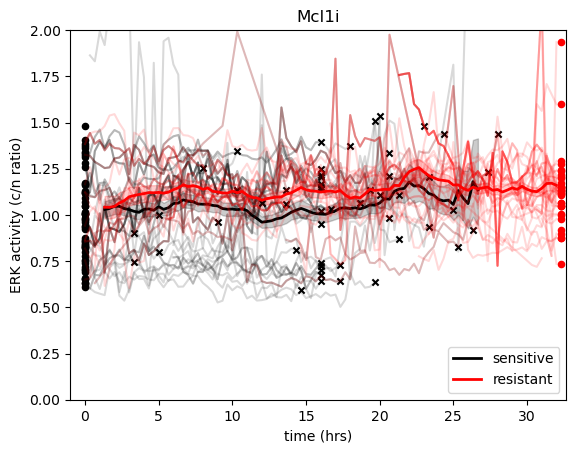



Palbociclib with 4 models and 55 cells


14 with 0 deaths
15 with 2 deaths
cell death at frame 17 traced for 7 frames
cell death at frame 15 traced for 16 frames
16 with 1 deaths
cell death at frame 76 traced for 77 frames
18 with 1 deaths
cell death at frame 33 traced for 34 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 95 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 97 frames
cell persistor at frame 96 traced for 54 frames
cell persistor at frame 96 traced for 95 f

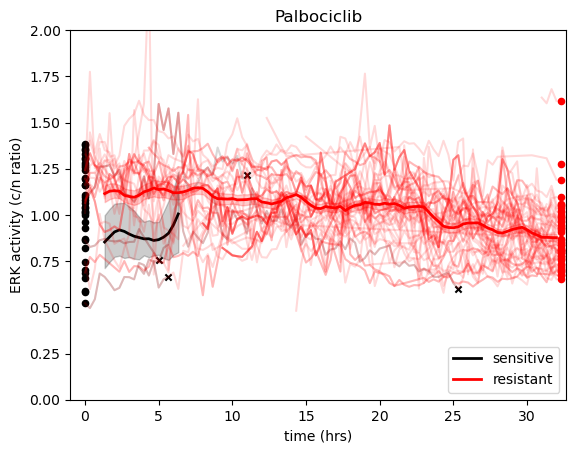



Palbociclib+Mcl1i with 2 models and 63 cells


24 with 6 deaths
cell death at frame 80 traced for 24 frames
cell death at frame 76 traced for 20 frames
cell death at frame 76 traced for 20 frames
cell death at frame 58 traced for 59 frames
cell death at frame 12 traced for 13 frames
cell death at frame 6 traced for 7 frames
25 with 19 deaths
cell death at frame 81 traced for 82 frames
cell death at frame 74 traced for 75 frames
cell death at frame 72 traced for 73 frames
cell death at frame 71 traced for 72 frames
cell death at frame 71 traced for 9 frames
cell death at frame 65 traced for 8 frames
cell death at frame 65 traced for 6 frames
cell death at frame 60 traced for 14 frames
cell death at frame 56 traced for 57 frames
cell death at frame 54 traced for 55 frames
cell death at frame 53 traced for 54 frames
cell death at frame 53 traced for 54 frames
cell death at frame 52 traced for 36 frames
cell death at frame 50 traced for 34 frames
cell death at frame 48 traced for 32 fram

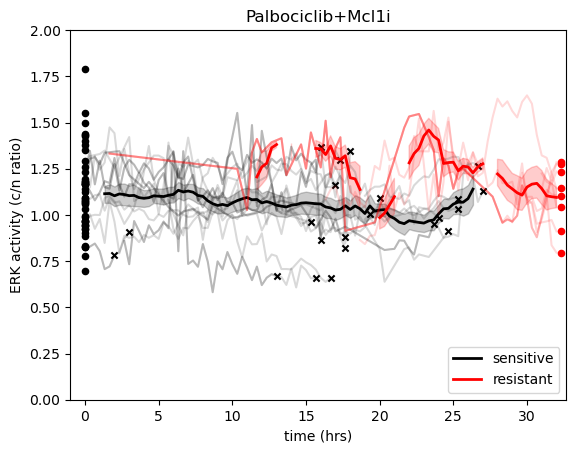

In [312]:
sys.path.append('/home/groups/ZuckermanLab/copperma/msmWE/BayesianBootstrap')
import bootstrap
import bootstrapN
scipy.average=np.mean
scipy.percentile=np.percentile
fw=4
nframes=sctm.nt
timestep=.5

for i_tm in range(nf):
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    ncells=0
    for imodel in indmodels:
        ncells=ncells+np.sum(modelSet[imodel].cells_frameSet==0)
    print('\n');print(f'{tmSet[i_tm]} with {indmodels.size} models and {ncells} cells');print('\n')
    erk_trajs_persist,erk_trajs_death,erk_initial=get_death_erk_info(indmodels,modelSet)
    plt.figure()
    ax=plt.gca()
    x_means_death=np.ones(nframes)*np.nan
    x_bounds_death=np.ones((nframes,2))*np.nan
    for iframe in range(fw,nframes):
        fwindow=np.arange(iframe-fw,iframe).astype(int)
        xs=erk_trajs_death[:,fwindow].flatten()
        xs=xs[np.isfinite(xs)]
        if xs.size>10:
            x_bounds_death[iframe,:]=bootstrap.get_CI(xs,1000)
            x_means_death[iframe]=np.nanmean(xs)
    
    for itraj in range(len(erk_trajs_death)):
        frames=np.where(np.isfinite(erk_trajs_death[itraj,:]))[0]
        if frames.size>0:
            ax.plot(frames*timestep,erk_trajs_death[itraj,frames],'-',color='black',alpha=.15)
            ax.scatter([frames[-1]*timestep],[erk_trajs_death[itraj,frames[-1]]],s=20,c='black',marker='x')
    
    ax.plot(np.arange(nframes)*timestep,x_means_death,'-',color='black',linewidth=2,label='sensitive')
    ax.fill_between(np.arange(nframes)*timestep,x_bounds_death[:,0],x_bounds_death[:,1],color='black',alpha=.2)
    
    x_means_persist=np.ones(nframes)*np.nan
    x_bounds_persist=np.ones((nframes,2))*np.nan
    for iframe in range(fw,nframes):
        fwindow=np.arange(iframe-fw,iframe).astype(int)
        xs=erk_trajs_persist[:,fwindow].flatten()
        xs=xs[np.isfinite(xs)]
        if xs.size>10:
            x_bounds_persist[iframe,:]=bootstrap.get_CI(xs,1000)
            x_means_persist[iframe]=np.nanmean(xs)

    plt.scatter(np.zeros_like(erk_initial),erk_initial,s=20,c='black',marker='o')
    for itraj in range(len(erk_trajs_persist)):
        ax.plot(np.where(np.isfinite(erk_trajs_persist[itraj,:]))[0]*timestep,erk_trajs_persist[itraj,np.where(np.isfinite(erk_trajs_persist[itraj,:]))[0]],'-',color='red',alpha=.15)
        ax.scatter([nframes*timestep],[erk_trajs_persist[itraj,-1]],s=20,c='red',marker='o')
        
    ax.plot(np.arange(nframes)*timestep,x_means_persist,'-',color='red',linewidth=2,label='resistant')
    ax.fill_between(np.arange(nframes)*timestep,x_bounds_persist[:,0],x_bounds_persist[:,1],color='red',alpha=.2)
    
    #plt.scatter(np.ones_like(erk_initial),erk_initial,s=20,c='green',marker='o')
    
    plt.ylabel('ERK activity (c/n ratio)')
    plt.xlabel('time (hrs)')
    plt.ylim(0,2.0)
    plt.xlim(-1,(nframes+1)*timestep)
    plt.legend(loc='lower right') #(bbox_to_anchor=(1.1, 1.0))
    plt.title(f'{tmSet[i_tm]}')
    plt.savefig(f'{date}/{tmSet[i_tm]}_erk_activity_dead_alive.png')
    plt.show()

In [ ]:
def generate_xcoords_violin(violinplot, sample_data):
    """
    Generate random x-coordinates within the width of each violin plot at the corresponding y-values.

    Args:
        violinplot: The matplotlib Violin plot object returned by ax.violinplot().
        sample_data: List or array of sample data used to create the violin plot.
    
    Returns:
        A list of (x, y) coordinates representing random points within the violin's width.
    """
    x_coords = []
    y_coords = []

    # Extract the collection of paths for each violin
    for i, body in enumerate(violinplot["bodies"]):
        # The violin's outline consists of a collection of paths
        path = body.get_paths()[0]
        vertices = path.vertices
        x, y = vertices[:, 0], vertices[:, 1]
        
        # For each y-value in the sample data, find the width of the violin
        y_sample = sample_data[i]
        for y_val in y_sample:
            # Find the x-coordinates where the violin intersects the y_val
            y_diff = np.abs(y - y_val)
            close_indices = np.where(y_diff == np.min(y_diff))[0]
            
            # Ensure we get the leftmost and rightmost bounds at this y-value
            x_bounds = x[close_indices]
            x_left = np.min(x_bounds)
            x_right = np.max(x_bounds)
            
            # Generate random x-coordinates within the bounds
            random_x = np.random.uniform(x_left, x_right, size=1)
            
            x_coords.append(random_x[0])
            y_coords.append(y_val)

    return x_coords



 FGF2 with 3 models and 83 cells




Control with 3 models and 78 cells




/tmp/ipykernel_1105285/478882416.py:44: RuntimeWarning: Mean of empty slice
  lungf_persist.append(np.nanmean(rdx_lung))
/tmp/ipykernel_1105285/478882416.py:45: RuntimeWarning: Mean of empty slice
  cc_persist.append(np.nanmean(rdx_cc))
/tmp/ipykernel_1105285/478882416.py:63: RuntimeWarning: Mean of empty slice
  lungf_initial.append(np.nanmean(rdx_lung))
/tmp/ipykernel_1105285/478882416.py:64: RuntimeWarning: Mean of empty slice
  cc_initial.append(np.nanmean(rdx_cc))




ERKi with 3 models and 95 cells




ERKi+MCl1i with 2 models and 69 cells




/tmp/ipykernel_1105285/478882416.py:25: RuntimeWarning: Mean of empty slice
  lungf_death.append(np.nanmean(rdx_lung))




FGF2+Mcl1i with 1 models and 16 cells




MEKi with 3 models and 154 cells




MEKi+Mcl1i with 2 models and 67 cells




/tmp/ipykernel_1105285/478882416.py:165: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig=plt.figure(figsize=(6,6))




Mcl1i with 4 models and 78 cells




/tmp/ipykernel_1105285/478882416.py:25: RuntimeWarning: Mean of empty slice
  lungf_death.append(np.nanmean(rdx_lung))
/tmp/ipykernel_1105285/478882416.py:64: RuntimeWarning: Mean of empty slice
  cc_initial.append(np.nanmean(rdx_cc))




Palbociclib with 4 models and 55 cells




Palbociclib+Mcl1i with 2 models and 63 cells




/tmp/ipykernel_1105285/478882416.py:45: RuntimeWarning: Mean of empty slice
  cc_persist.append(np.nanmean(rdx_cc))


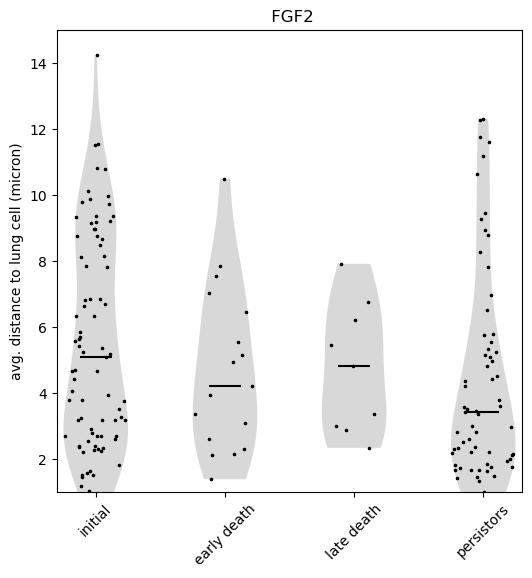

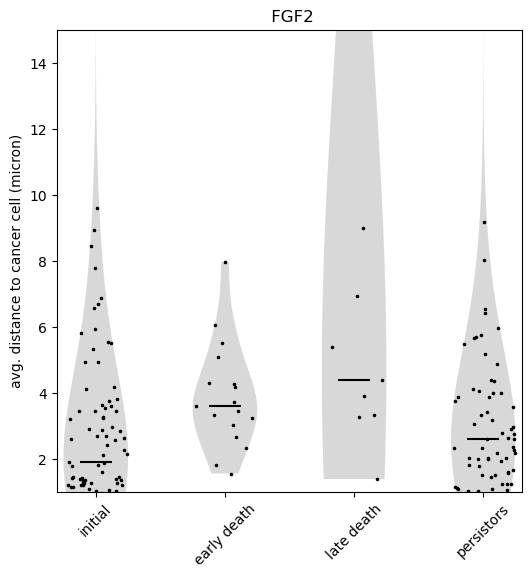

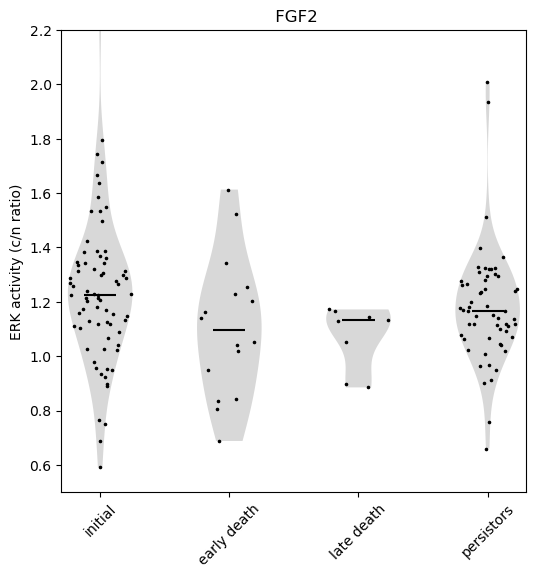

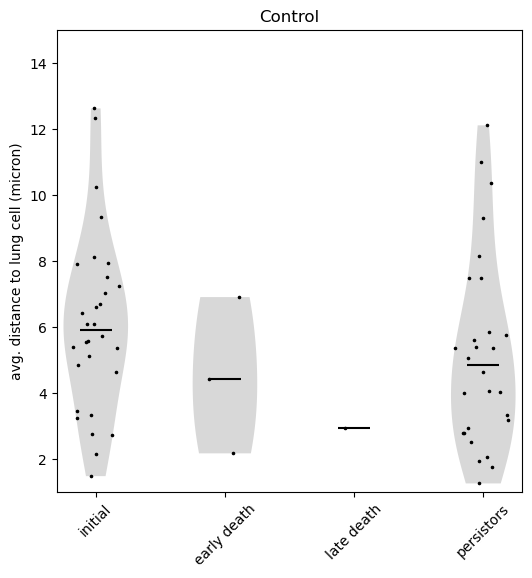

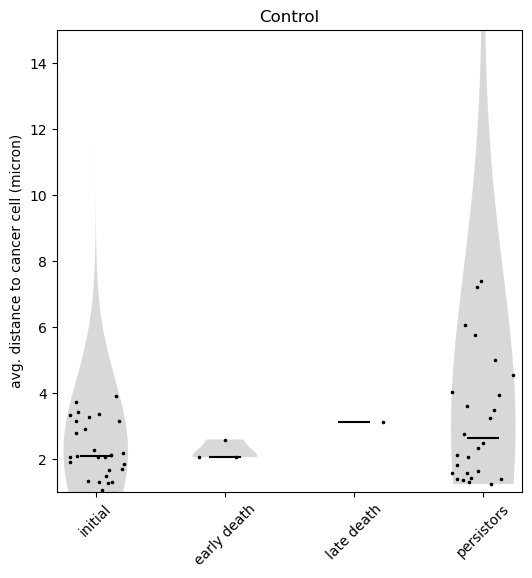

...

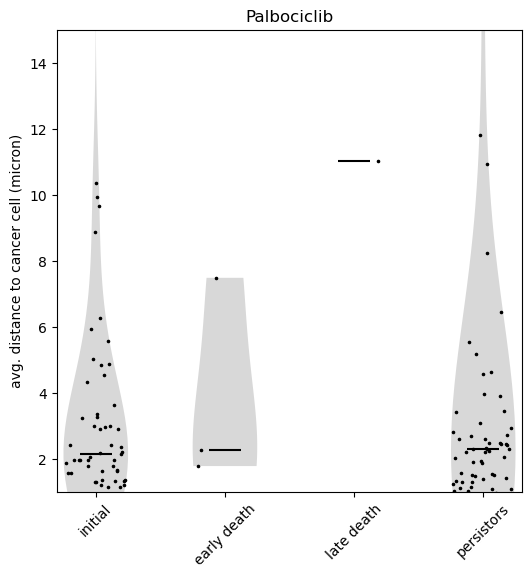

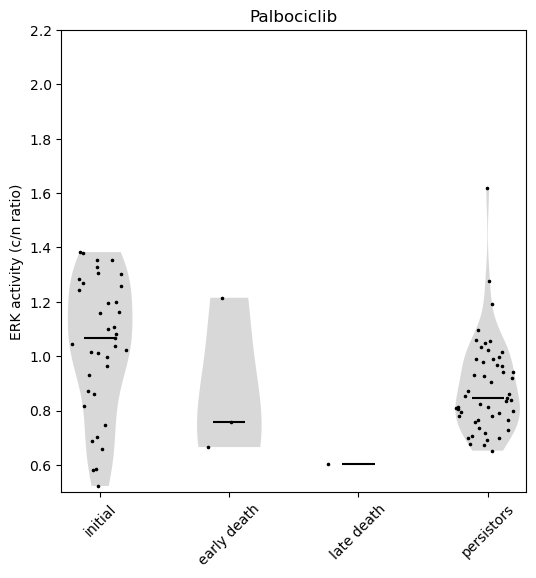

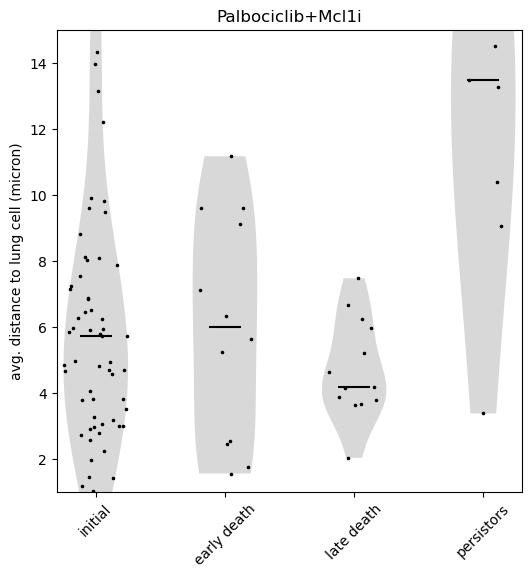

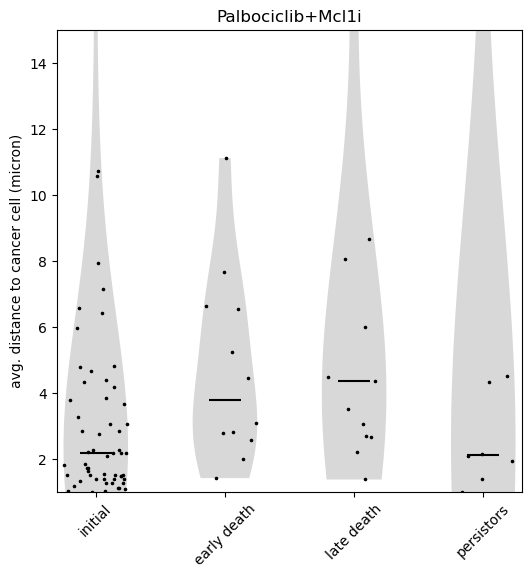

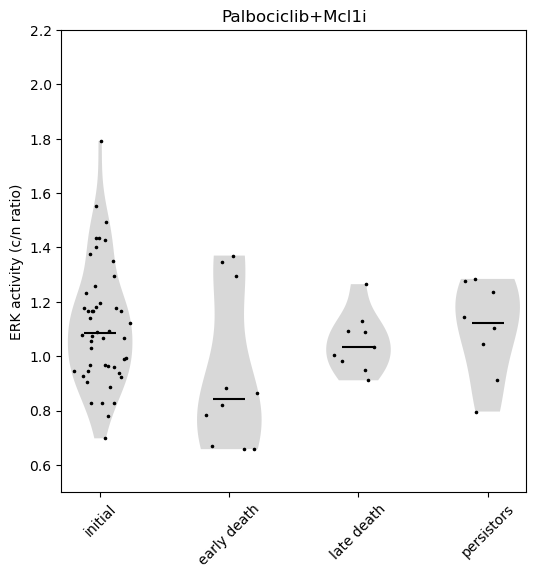

In [318]:
framecut_early=56
for i_tm in range(nf):
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    ncells=0
    for imodel in indmodels:
        ncells=ncells+np.sum(modelSet[imodel].cells_frameSet==0)
    print('\n');print(f'{tmSet[i_tm]} with {indmodels.size} models and {ncells} cells');print('\n')
    
    frames_death=[]
    erk_death=[]
    akt_death=[]
    lungf_death=[]
    cc_death=[]
    for imodel in indmodels:
        sctm=modelSet[imodel]
        for ideath in range(sctm.inds_death.size):
            ic=sctm.inds_death[ideath]
            frames_death.append(sctm.cells_frameSet[ic])
            erk_death.append(sctm.x_signal[ic])
            akt_death.append(sctm.x_signal_akt[ic])
            indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
            rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            lungf_death.append(np.nanmean(rdx_lung))
            cc_death.append(np.nanmean(rdx_cc))
            
    frames_persist=[]
    erk_persist=[]
    akt_persist=[]
    lungf_persist=[]
    cc_persist=[]
    for imodel in indmodels:
        sctm=modelSet[imodel]
        inds_persistors=np.where(sctm.cells_frameSet==np.max(sctm.cells_frameSet))[0]
        for ipersist in range(inds_persistors.size):
            ic=inds_persistors[ipersist]
            frames_persist.append(sctm.cells_frameSet[ic])
            erk_persist.append(sctm.x_signal[ic])
            akt_persist.append(sctm.x_signal_akt[ic])
            indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
            rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            lungf_persist.append(np.nanmean(rdx_lung))
            cc_persist.append(np.nanmean(rdx_cc))
    
    frames_initial=[]
    erk_initial=[]
    akt_initial=[]
    lungf_initial=[]
    cc_initial=[]
    for imodel in indmodels:
        sctm=modelSet[imodel]
        inds_initial=np.where(sctm.cells_frameSet==0)[0]
        for icell in range(inds_initial.size):
            ic=inds_initial[icell]
            frames_initial.append(sctm.cells_frameSet[ic])
            erk_initial.append(sctm.x_signal[ic])
            akt_initial.append(sctm.x_signal_akt[ic])
            indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
            rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            lungf_initial.append(np.nanmean(rdx_lung))
            cc_initial.append(np.nanmean(rdx_cc))
        
    #lung contacts
    fig=plt.figure(figsize=(6,6))
    ax=plt.gca()
    setv=np.array(lungf_initial)/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_early=np.where(np.array(frames_death)<framecut_early)[0]
    setv=np.array(lungf_death)[inds_early]/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
    setv=np.array(lungf_death)[inds_late]/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    setv=np.array(lungf_persist)/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
        
    ax.set_xlim(-.3,3.3)
    ax.set_ylim(1,15)
    ax.set_xticks(range(0,3+1))
    ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
    ax.set_ylabel('avg. distance to lung cell (micron)')
    plt.title(f'{tmSet[i_tm]}')
    plt.savefig(f'{date}/{tmSet[i_tm]}_lung_contact_earlylate.png')
    
    #cc contact
    fig=plt.figure(figsize=(6,6))
    ax=plt.gca()
    setv=np.array(cc_initial)/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_early=np.where(np.array(frames_death)<framecut_early)[0]
    setv=np.array(cc_death)[inds_early]/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
    setv=np.array(cc_death)[inds_late]/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    setv=np.array(cc_persist)/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    ax.set_xlim(-.3,3.3)
    ax.set_ylim(1,15)
    ax.set_xticks(range(0,3+1))
    ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
    ax.set_ylabel('avg. distance to cancer cell (micron)')
    plt.title(f'{tmSet[i_tm]}')
    plt.savefig(f'{date}/{tmSet[i_tm]}_cancer_contact_earlylate.png')
    
    #erk
    fig=plt.figure(figsize=(6,6))
    ax=plt.gca()
    setv=np.array(erk_initial)
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_early=np.where(np.array(frames_death)<framecut_early)[0]
    setv=np.array(erk_death)[inds_early]
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
    setv=np.array(erk_death)[inds_late]
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    setv=np.array(erk_persist)
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    ax.set_xlim(-.3,3.3)
    ax.set_ylim(.5,2.2)
    ax.set_xticks(range(0,3+1))
    ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
    ax.set_ylabel('ERK activity (c/n ratio)')
    plt.title(f'{tmSet[i_tm]}')
    plt.savefig(f'{date}/{tmSet[i_tm]}_erk_activity_earlylate.png')

In [286]:
tmSet

[' FGF2',
 'Control',
 'ERKi',
 'ERKi+MCl1i',
 'FGF2+Mcl1i',
 'MEKi',
 'MEKi+Mcl1i',
 'Mcl1i',
 'Palbociclib',
 'Palbociclib+Mcl1i']



9 models and 224 cells




/tmp/ipykernel_1105285/587928169.py:29: RuntimeWarning: Mean of empty slice
  lungf_death.append(np.nanmean(rdx_lung))
/tmp/ipykernel_1105285/587928169.py:49: RuntimeWarning: Mean of empty slice
  cc_persist.append(np.nanmean(rdx_cc))
/tmp/ipykernel_1105285/587928169.py:68: RuntimeWarning: Mean of empty slice
  cc_initial.append(np.nanmean(rdx_cc))


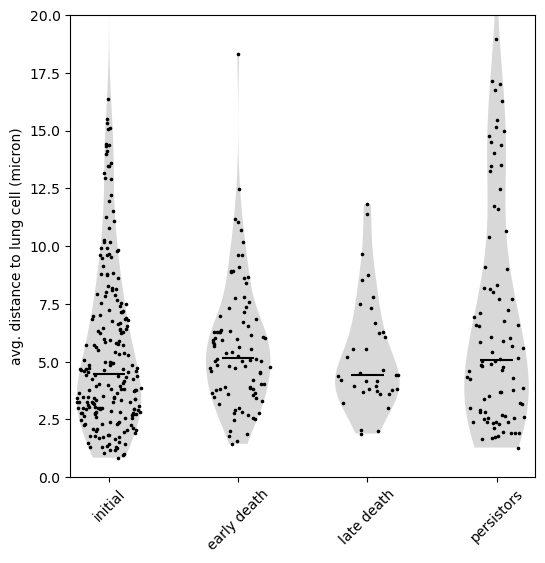

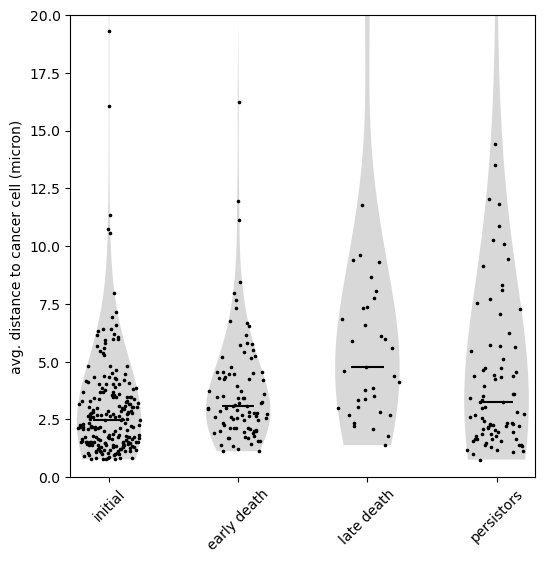

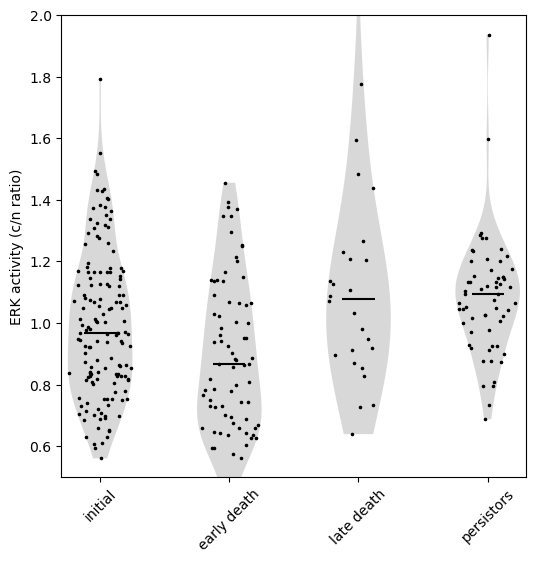

In [316]:
indmodels=[]
for i_tm in range(nf):
    if 'Mcl1i' in tmSet[i_tm]:
        indmodels.append(np.where(inds_tmSet_models==i_tm)[0])

indmodels=np.concatenate(indmodels)

indmodels=np.intersect1d(indmodels,indgood_models)
ncells=0
for imodel in indmodels:
    ncells=ncells+np.sum(modelSet[imodel].cells_frameSet==0)
print('\n');print(f'{indmodels.size} models and {ncells} cells');print('\n')

frames_death=[]
erk_death=[]
akt_death=[]
lungf_death=[]
cc_death=[]
for imodel in indmodels:
    sctm=modelSet[imodel]
    for ideath in range(sctm.inds_death.size):
        ic=sctm.inds_death[ideath]
        frames_death.append(sctm.cells_frameSet[ic])
        erk_death.append(sctm.x_signal[ic])
        akt_death.append(sctm.x_signal_akt[ic])
        indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
        rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        lungf_death.append(np.nanmean(rdx_lung))
        cc_death.append(np.nanmean(rdx_cc))
        
frames_persist=[]
erk_persist=[]
akt_persist=[]
lungf_persist=[]
cc_persist=[]
for imodel in indmodels:
    sctm=modelSet[imodel]
    inds_persistors=np.where(sctm.cells_frameSet==np.max(sctm.cells_frameSet))[0]
    for ipersist in range(inds_persistors.size):
        ic=inds_persistors[ipersist]
        frames_persist.append(sctm.cells_frameSet[ic])
        erk_persist.append(sctm.x_signal[ic])
        akt_persist.append(sctm.x_signal_akt[ic])
        indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
        rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        lungf_persist.append(np.nanmean(rdx_lung))
        cc_persist.append(np.nanmean(rdx_cc))

frames_initial=[]
erk_initial=[]
akt_initial=[]
lungf_initial=[]
cc_initial=[]
for imodel in indmodels:
    sctm=modelSet[imodel]
    inds_initial=np.where(sctm.cells_frameSet==0)[0]
    for icell in range(inds_initial.size):
        ic=inds_initial[icell]
        frames_initial.append(sctm.cells_frameSet[ic])
        erk_initial.append(sctm.x_signal[ic])
        akt_initial.append(sctm.x_signal_akt[ic])
        indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
        rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        lungf_initial.append(np.nanmean(rdx_lung))
        cc_initial.append(np.nanmean(rdx_cc))
    
#lung contacts
fig=plt.figure(figsize=(6,6))
ax=plt.gca()
setv=np.array(lungf_initial)/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_early=np.where(np.array(frames_death)<framecut_early)[0]
setv=np.array(lungf_death)[inds_early]/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
setv=np.array(lungf_death)[inds_late]/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

setv=np.array(lungf_persist)/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
ax.set_xlim(-.3,3.3)
ax.set_ylim(0,20)
ax.set_xticks(range(0,3+1))
ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
ax.set_ylabel('avg. distance to lung cell (micron)')
plt.savefig(f'{date}/lung_contact_earlylate.png')

#cc contact
fig=plt.figure(figsize=(6,6))
ax=plt.gca()
setv=np.array(cc_initial)/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_early=np.where(np.array(frames_death)<framecut_early)[0]
setv=np.array(cc_death)[inds_early]/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
setv=np.array(cc_death)[inds_late]/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

setv=np.array(cc_persist)/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

ax.set_xlim(-.3,3.3)
ax.set_ylim(0,20)
ax.set_xticks(range(0,3+1))
ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
ax.set_ylabel('avg. distance to cancer cell (micron)')
plt.savefig(f'{date}/cancer_contact_earlylate.png')

#erk
fig=plt.figure(figsize=(6,6))
ax=plt.gca()
setv=np.array(erk_initial)
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_early=np.where(np.array(frames_death)<framecut_early)[0]
setv=np.array(erk_death)[inds_early]
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
setv=np.array(erk_death)[inds_late]
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

setv=np.array(erk_persist)
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

ax.set_xlim(-.3,3.3)
ax.set_ylim(.5,2)
ax.set_xticks(range(0,3+1))
ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
ax.set_ylabel('ERK activity (c/n ratio)')
plt.savefig(f'{date}/erk_activity_earlylate.png')

In [271]:
def generate_xcoords_violin(violinplot, sample_data):
    """
    Generate random x-coordinates within the width of each violin plot at the corresponding y-values.

    Args:
        violinplot: The matplotlib Violin plot object returned by ax.violinplot().
        sample_data: List or array of sample data used to create the violin plot.
    
    Returns:
        A list of (x, y) coordinates representing random points within the violin's width.
    """
    x_coords = []
    y_coords = []

    # Extract the collection of paths for each violin
    for i, body in enumerate(violinplot["bodies"]):
        # The violin's outline consists of a collection of paths
        path = body.get_paths()[0]
        vertices = path.vertices
        x, y = vertices[:, 0], vertices[:, 1]
        
        # For each y-value in the sample data, find the width of the violin
        y_sample = sample_data[i]
        for y_val in y_sample:
            # Find the x-coordinates where the violin intersects the y_val
            y_diff = np.abs(y - y_val)
            close_indices = np.where(y_diff == np.min(y_diff))[0]
            
            # Ensure we get the leftmost and rightmost bounds at this y-value
            x_bounds = x[close_indices]
            x_left = np.min(x_bounds)
            x_right = np.max(x_bounds)
            
            # Generate random x-coordinates within the bounds
            random_x = np.random.uniform(x_left, x_right, size=1)
            
            x_coords.append(random_x[0])
            y_coords.append(y_val)

    return x_coords

In [239]:
vplot['bodies'][0].get_paths()[0].vertices[:,0]

array([3.03038049, 2.96961951, 2.96158189, 2.95271056, 2.94313302,
       2.93297768, 2.92235858, 2.91135394, 2.89998247, 2.88818924,
       2.87585567, 2.86284381, 2.8490728 , 2.83460896, 2.81973643,
       2.80497148, 2.79099768, 2.77853021, 2.76815321, 2.76019243,
       2.75467447, 2.75138585, 2.75      , 2.75021321, 2.75183343,
       2.75479505, 2.75910946, 2.76478774, 2.77177681, 2.77993589,
       2.78905573, 2.79890248, 2.80926022, 2.81995338, 2.83084586,
       2.84182795, 2.85280669, 2.86370927, 2.87449673, 2.88517579,
       2.89579503, 2.90641909, 2.9170862 , 2.92776435, 2.93832426,
       2.94854188, 2.95813273, 2.96680809, 2.97433518, 2.9805823 ,
       2.98553598, 2.98928815, 2.99200233, 2.99387402, 2.99509925,
       2.99585754, 2.99630709, 2.99658445, 2.99680184, 2.99704068,
       2.99734496, 2.99771986, 2.99813861, 2.99855579, 2.99892169,
       2.99919252, 2.99933405, 2.99932028, 2.99913149, 2.99875641,
       2.99819999, 2.99749468, 2.99670872, 2.99594445, 2.99532

In [111]:
indgood_models=indgood_models[np.where(indgood_models!=33)[0]]
indmodels_death=indgood_models.copy()

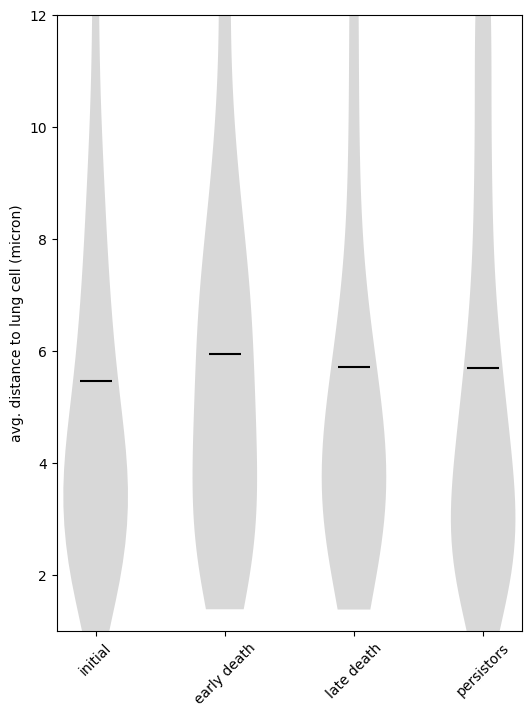

In [113]:
framecut_early=50
fig=plt.figure(figsize=(6,8))
ax=plt.gca()
setv=np.array(lungf_initial)/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

inds_early=np.where(np.array(frames_death)<framecut_early)[0]
setv=np.array(lungf_death)[inds_early]/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
setv=np.array(lungf_death)[inds_late]/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

setv=np.array(lungf_persist)/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

ax.set_xlim(-.3,3.3)
ax.set_ylim(1,12)
ax.set_xticks(range(0,3+1))
ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
ax.set_ylabel('avg. distance to lung cell (micron)')
plt.savefig(f'{date}/lung_contact_earlylate.png')

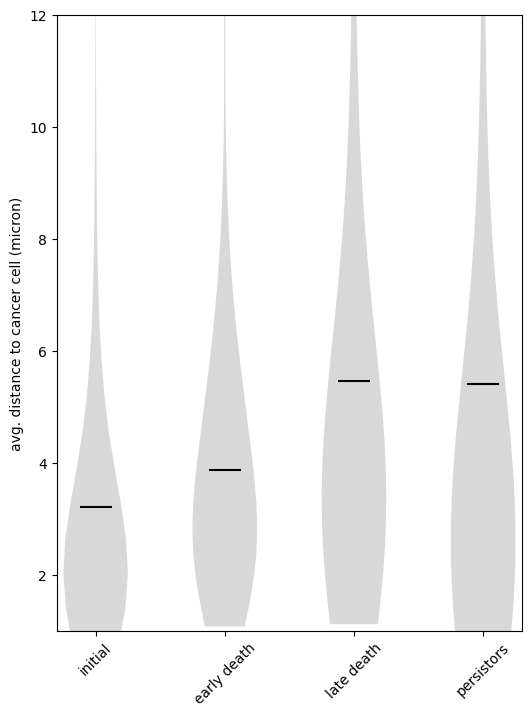

In [116]:
framecut_early=50
fig=plt.figure(figsize=(6,8))
ax=plt.gca()
setv=np.array(cc_initial)/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

inds_early=np.where(np.array(frames_death)<framecut_early)[0]
setv=np.array(cc_death)[inds_early]/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
setv=np.array(cc_death)[inds_late]/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

setv=np.array(cc_persist)/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

ax.set_xlim(-.3,3.3)
ax.set_ylim(1,12)
ax.set_xticks(range(0,3+1))
ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
ax.set_ylabel('avg. distance to cancer cell (micron)')
plt.savefig(f'{date}/cancer_contact_earlylate.png')

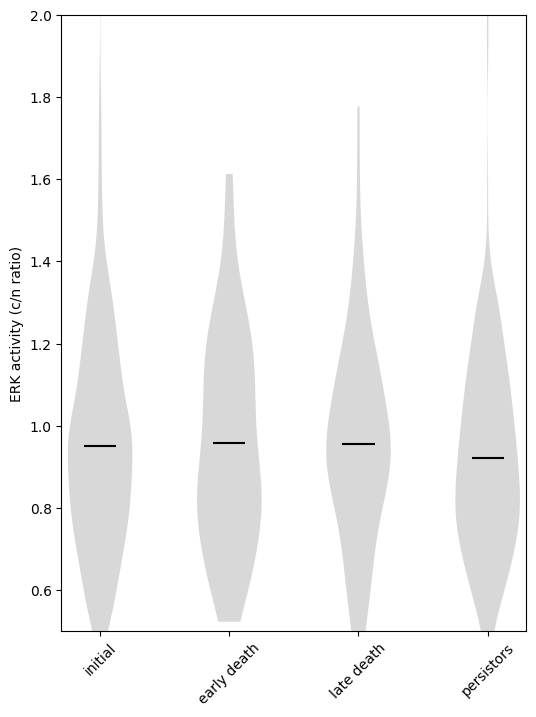

In [117]:
framecut_early=50
fig=plt.figure(figsize=(6,8))
ax=plt.gca()
setv=np.array(erk_initial)
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

inds_early=np.where(np.array(frames_death)<framecut_early)[0]
setv=np.array(erk_death)[inds_early]
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
setv=np.array(erk_death)[inds_late]
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

setv=np.array(erk_persist)
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

ax.set_xlim(-.3,3.3)
ax.set_ylim(.5,2)
ax.set_xticks(range(0,3+1))
ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
ax.set_ylabel('ERK activity (c/n ratio)')
plt.savefig(f'{date}/erk_activity_earlylate.png')

cell death at frame 48 traced for 15 frames
cell death at frame 39 traced for 27 frames
cell death at frame 38 traced for 7 frames
cell death at frame 29 traced for 9 frames
cell death at frame 8 traced for 9 frames
cell death at frame 91 traced for 92 frames
cell death at frame 90 traced for 12 frames
cell death at frame 77 traced for 29 frames
cell death at frame 69 traced for 6 frames
cell death at frame 60 traced for 6 frames
cell death at frame 59 traced for 7 frames
cell death at frame 55 traced for 7 frames
cell death at frame 45 traced for 46 frames
cell death at frame 44 traced for 26 frames
cell death at frame 22 traced for 23 frames
cell death at frame 20 traced for 21 frames
cell death at frame 20 traced for 7 frames
cell death at frame 17 traced for 7 frames
cell death at frame 17 traced for 9 frames
cell death at frame 13 traced for 12 frames
cell death at frame 10 traced for 7 frames
cell death at frame 10 traced for 7 frames
cell death at frame 9 traced for 10 frames
ce

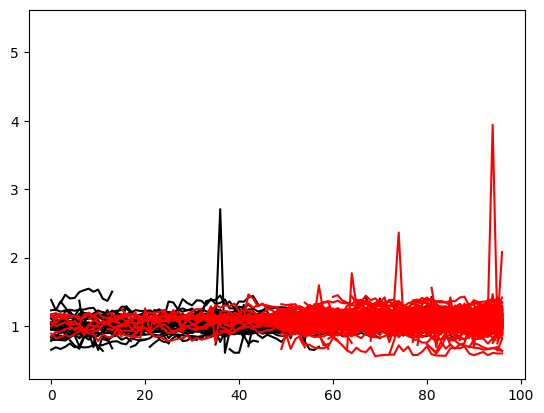

In [115]:
for imodel in indmodels_death:
    sctm=modelSet[imodel]
    for ideath in range(sctm.inds_death.size):
        ic=sctm.inds_death[ideath]
        cell_traj=sctm.get_cell_trajectory(ic)
        print(f'cell death at frame {sctm.cells_frameSet[ic]} traced for {cell_traj.size} frames')
        frames=sctm.cells_frameSet[cell_traj]
        akt_traj=sctm.x_signal_akt[cell_traj]
        plt.plot(frames,akt_traj,color='black')

for imodel in indmodels_death:
    sctm=modelSet[imodel]
    inds_persistors=np.where(sctm.cells_frameSet==np.max(sctm.cells_frameSet))[0]
    for ipersist in range(inds_persistors.size):
        ic=inds_persistors[ipersist]
        cell_traj=sctm.get_cell_trajectory(ic)
        print(f'cell death at frame {sctm.cells_frameSet[ic]} traced for {cell_traj.size} frames')
        frames=sctm.cells_frameSet[cell_traj]
        akt_traj=sctm.x_signal_akt[cell_traj]
        plt.plot(frames,akt_traj,color='red')